# Big City, Big Data : Discovering Jaipur Tourism with Geospatial Analysis

## Jaipur, India

Jaipur is the capital of India’s Rajasthan state. Founded in 1727 and now called the Old City, or “Pink City” for its trademark building color. At the center of its stately street grid (notable in India) stands the opulent, colonnaded City Palace complex. UNESCO World Heritage Committee inscribed Jaipur the "Pink City of India" among its World Heritage Sites.

Jaipur is a popular tourist destination in India and forms a part of the west Golden Triangle tourist circuit, It also serves as a gateway to other tourist destinations in Rajasthan. In the 2008 Conde Nast Traveller Readers Choice Survey, Jaipur was ranked the 7th best place to visit in Asia. According to TripAdvisor's 2015 Traveller's Choice Awards for Destination, Jaipur ranked 1st among the Indian destinations for the year.

## Geospatial Analysis

Geospatial analytics gathers, manipulates and displays geographic information system (GIS) data and imagery including GPS and satellite photographs. Geospatial data analytics rely on geographic coordinates and specific identifiers such as street address and zip code. They are used to create geographic models and data visualizations for more accurate modeling and predictions of trends.

Geospatial analytics uses data from all kinds of technology — GPS, location sensors, social media, mobile devices, satellite imagery — to build data visualizations for understanding phenomena and finding trends in complex relationships between people and places.

## Purpose of this project

The following are the aim of this project:

1. Discover Insights
2. Find out density cluster of the Hotels using DBSCAN
3. Spatial Autocorrelation Price of Hotels to find out the similarities

### Setting Up

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from datetime import datetime #for manipulating dates and times
import matplotlib.pyplot as plt #graph library
from wordcloud import WordCloud #word cloud library
import geopandas as gpd #working with geospatial data easier
import folium #DatViz Map
from geopy.geocoders import Nominatim #Calculate distance
import osmnx as ox #download geospatial data from OpenStreetMap
import shapely #for set-theoretic analysis and manipulation of planar features
from shapely.ops import transform 
from shapely.geometry import Point, LineString, Polygon, MultiPoint
from shapely.ops import nearest_points
from shapely import speedups
shapely.speedups.enable()
import pyproj #Performs cartographic transformations
import contextily as cx #to retrieve tile maps from the internet
import plotly.express as px #for visualizing Data
import plotly.graph_objects as go
import json
from urllib.request import urlopen

In [2]:
df_places = pd.read_csv ('Places.csv')
df_hotels = pd.read_csv ('Hotels.csv')
df_types = pd.read_csv('Types.csv')

In [3]:
df_places.head()

,PID,POIs,LATITUDE,LONGITUDE,IN-TIME1,IN-TIME2,OUT-TIME1,OUT-TIME2
0,POI1,AMBER PALACE,26.985487,75.851345,10:00,18:30,17:00,21:15
1,POI2,CITY PALACE JAIPUR,26.925771,75.823658,9:30,-,17:00,-
2,POI3,JANTAR MANTAR JAIPUR,26.924762,75.824560,9:00,-,17:00,-
3,POI4,HAWA MAHAL,26.923936,75.826744,9:00,-,16:30,-
4,POI5,ALBERT HALL MUSEUM (CENTRAL MUSEUM),26.911576,75.819487,9:00,19:00,17:00,22:00


In [4]:
df_places.columns

Index(['PID', 'POIs', 'LATITUDE', 'LONGITUDE', 'IN-TIME1', 'IN-TIME2',
       'OUT-TIME1', 'OUT-TIME2'],
      dtype='object')

In [5]:
df_places.shape

(71, 8)

In [6]:
df_places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PID        71 non-null     object 
 1   POIs       71 non-null     object 
 2   LATITUDE   71 non-null     float64
 3   LONGITUDE  71 non-null     float64
 4   IN-TIME1   71 non-null     object 
 5   IN-TIME2   71 non-null     object 
 6   OUT-TIME1  71 non-null     object 
 7   OUT-TIME2  71 non-null     object 
dtypes: float64(2), object(6)
memory usage: 4.6+ KB


In [7]:
df_hotels.head(10)

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng
0,HID1,HOTEL ANURAAG VILLA JAIPUR,898.92,1305,26.927230,75.789207
1,HID2,HILTON JAIPUR,2771.67,4358,26.973697,75.844382
2,HID3,"TRIDENT, JAIPUR",4120.05,499,26.957344,75.842886
3,HID4,THE FERN RESIDENCY JAIPUR,2172.39,278,26.874359,75.816421
4,HID5,"ITC RAJPUTANA, JAIPUR A LUXURY COLLECTION HOTE...",3221.13,6189,26.919313,75.791175
5,HID6,HOLIDAY INN JAIPUR CITY CENTRE JAIPUR,4644.42,4392,26.902940,75.792486
6,HID7,LEISURE INN GRAND CHANAKYA JAIPUR,1498.20,1297,26.916518,75.807888
7,HID8,RADISSON BLU JAIPUR,4045.14,2239,26.842513,75.794125
8,HID9,UMAID BHAWAN HERITAGE HOUSE HOTEL JAIPUR,4045.14,3971,26.928506,75.792419
9,HID10,PEARL PALACE HERITAGE JAIPUR,1722.93,1467,26.915911,75.792374


In [8]:
df_hotels.head()

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng
0,HID1,HOTEL ANURAAG VILLA JAIPUR,898.92,1305,26.927230,75.789207
1,HID2,HILTON JAIPUR,2771.67,4358,26.973697,75.844382
2,HID3,"TRIDENT, JAIPUR",4120.05,499,26.957344,75.842886
3,HID4,THE FERN RESIDENCY JAIPUR,2172.39,278,26.874359,75.816421
4,HID5,"ITC RAJPUTANA, JAIPUR A LUXURY COLLECTION HOTE...",3221.13,6189,26.919313,75.791175


In [9]:
df_hotels.describe()

,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng
count,254.000000,254.000000,254.000000,254.000000
mean,2983.149803,540.582677,26.914314,75.800445
std,7420.243135,863.444151,0.043156,0.042395
min,150.000000,1.000000,26.767485,75.590469
25%,1123.650000,88.500000,26.902572,75.789400
50%,1797.840000,212.000000,26.919133,75.796085
75%,2846.580000,549.250000,26.928681,75.810282
max,112365.000000,6189.000000,27.066656,76.146076


In [10]:
df_hotels.columns

Index(['HID', 'HOTEL', 'PRICE_RUPEES', 'NUMBER_OF_REVIEWS', 'Lat', 'Lng'], dtype='object')

In [11]:
df_hotels.shape

(254, 6)

In [12]:
df_hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 254 entries, 0 to 253
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   HID                254 non-null    object 
 1   HOTEL              254 non-null    object 
 2   PRICE_RUPEES       254 non-null    float64
 3   NUMBER_OF_REVIEWS  254 non-null    int64  
 4   Lat                254 non-null    float64
 5   Lng                254 non-null    float64
dtypes: float64(3), int64(1), object(2)
memory usage: 12.0+ KB


In [13]:
df_types.head(10)

,PID,POIs,PRIORITY_1,PRIORITY_2,PRIORITY_3,PRIORITY_4,PRIORITY_5
0,POI1,AMBER PALACE,History and Culture,Museum,Local Experiences,Scenic,Adventure
1,POI2,CITY PALACE JAIPUR,History and Culture,Museum,Local Experiences,Scenic,Food and Drinks
2,POI3,JANTAR MANTAR JAIPUR,History and Culture,Museum,-,-,-
3,POI4,HAWA MAHAL,History and Culture,-,Local Experiences,Scenic,-
4,POI5,ALBERT HALL MUSEUM (CENTRAL MUSEUM),Museum,History and Culture,Scenic,-,-
5,POI6,NAHARGARH FORT,Museum,History and Culture,Scenic,Local Experiences,Food and Drinks
6,POI7,BIRLA TEMPLE JAIPUR,Religious,Local Experiences,Scenic,-,-
7,POI8,JAL MAHAL,History and Culture,Scenic,Local Experiences,Adventure,-
8,POI9,KING EDWARD MEMORIAL,History and Culture,Museum,Local Experiences,-,Food and Drinks
9,POI10,SISODIA RANI PALACE AND GARDEN,Scenic,History and Culture,-,-,-


In [14]:
df_types.columns

Index(['PID', 'POIs', 'PRIORITY_1', 'PRIORITY_2', 'PRIORITY_3', 'PRIORITY_4',
       'PRIORITY_5'],
      dtype='object')

In [15]:
df_types.shape

(71, 7)

In [16]:
df_types.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   PID         71 non-null     object
 1   POIs        71 non-null     object
 2   PRIORITY_1  71 non-null     object
 3   PRIORITY_2  71 non-null     object
 4   PRIORITY_3  71 non-null     object
 5   PRIORITY_4  71 non-null     object
 6   PRIORITY_5  71 non-null     object
dtypes: object(7)
memory usage: 4.0+ KB


### Handling the Data 

In [17]:
#change '-' into NaN
df_places = df_places.replace('-',np.nan)
df_hotels = df_hotels.replace('-',np.nan)
df_types = df_types.replace('-',np.nan)

In [18]:
print('Place has',df_places.isna().sum().sum(),'empty data')
print('Hotel has',df_hotels.isna().sum().sum(),'empty data')
print('Type has',df_types.isna().sum().sum(),'empty data')

Place has 122 empty data
Hotel has 0 empty data
Type has 178 empty data


In [19]:
#transform datatype into datetime
df_places['IN-TIME1'] = pd.to_datetime(df_places['IN-TIME1'], format='%H:%M').dt.time
df_places['IN-TIME2'] = pd.to_datetime(df_places['IN-TIME2'], format='%H:%M').dt.time
df_places['OUT-TIME1'] = pd.to_datetime(df_places['OUT-TIME1'], format='%H:%M').dt.time
df_places['OUT-TIME2'] = pd.to_datetime(df_places['OUT-TIME2'], format='%H:%M').dt.time

In [20]:
df_places.head()

,PID,POIs,LATITUDE,LONGITUDE,IN-TIME1,IN-TIME2,OUT-TIME1,OUT-TIME2
0,POI1,AMBER PALACE,26.985487,75.851345,10:00:00,18:30:00,17:00:00,21:15:00
1,POI2,CITY PALACE JAIPUR,26.925771,75.823658,09:30:00,NaT,17:00:00,NaT
2,POI3,JANTAR MANTAR JAIPUR,26.924762,75.824560,09:00:00,NaT,17:00:00,NaT
3,POI4,HAWA MAHAL,26.923936,75.826744,09:00:00,NaT,16:30:00,NaT
4,POI5,ALBERT HALL MUSEUM (CENTRAL MUSEUM),26.911576,75.819487,09:00:00,19:00:00,17:00:00,22:00:00


### Exploratory Data Analysis

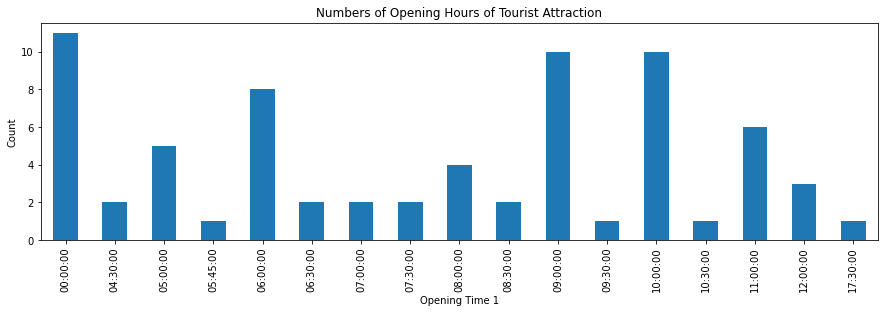

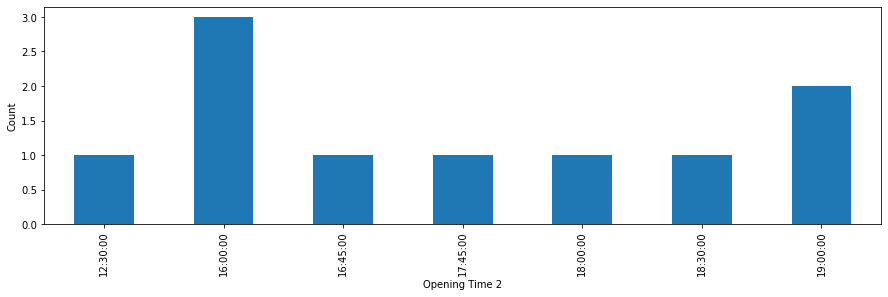

In [21]:
plt.subplots()
ax1 = df_places['IN-TIME1'].value_counts().sort_index().plot(figsize = (15,4),
                                              kind = 'bar')
ax1.set_xlabel('Opening Time 1')
ax1.set_ylabel('Count')
ax1.set_title('Numbers of Opening Hours of Tourist Attraction')

plt.subplots()
ax2 = df_places['IN-TIME2'].value_counts().sort_index().plot(figsize =(15,4),
                                                kind = 'bar')
ax2.set_xlabel('Opening Time 2')
ax2.set_ylabel('Count')

plt.show()

In Jaipur several tourist attractions have two Opening Times and Closing Times. In the first opening hours a lot of tourist attractions open in the midnight followed by 09:00 and 10:00, the second opening dominated by tourist attractions which open in 16:00 and followed by 19:00

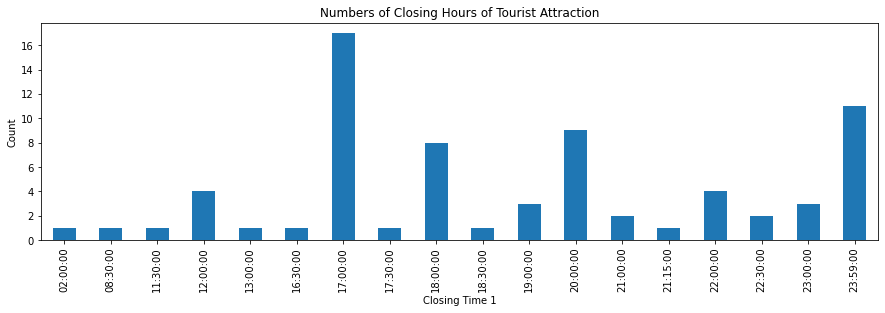

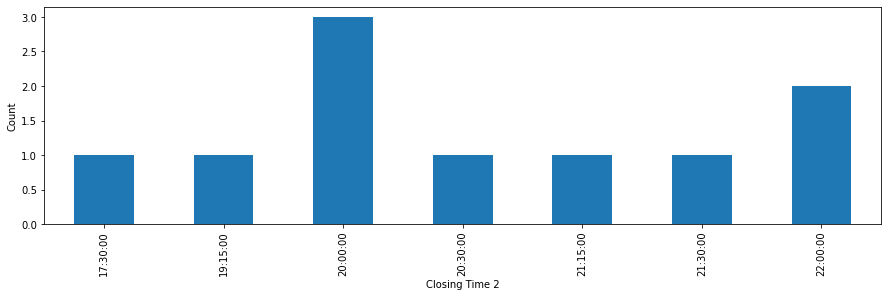

In [22]:
plt.subplots()
ax1 = df_places['OUT-TIME1'].value_counts().sort_index().plot(figsize = (15,4),
                                              kind = 'bar')
ax1.set_xlabel('Closing Time 1')
ax1.set_ylabel('Count')
ax1.set_title('Numbers of Closing Hours of Tourist Attraction')

plt.subplots()
ax2 = df_places['OUT-TIME2'].value_counts().sort_index().plot(figsize =(15,4),
                                                kind = 'bar')
ax2.set_xlabel('Closing Time 2')
ax2.set_ylabel('Count')

plt.show()

A lot of tourist attractions closed by 17:00 in the first closing time and 20:00 in the second closing time

<AxesSubplot:>

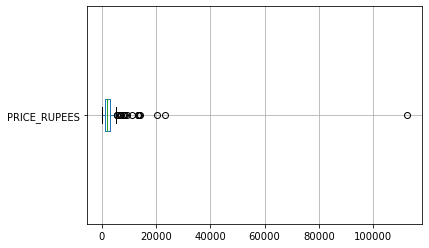

In [23]:
df_hotels.boxplot(column = 'PRICE_RUPEES', vert = False)

Hotel price distribution in Jaipur varies greatly even surpass 100.000 ruppees.

<AxesSubplot:title={'center':'TOP 10 HOTELS IN JAIPUR'}, ylabel='HOTEL'>

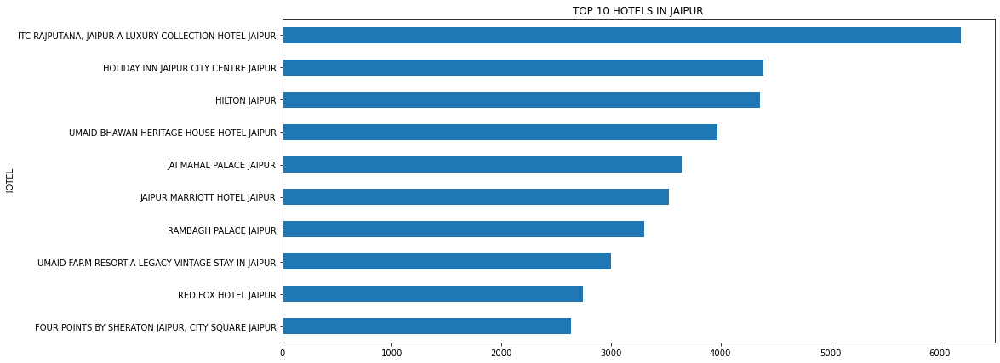

In [25]:
df_hotels.sort_values('NUMBER_OF_REVIEWS', ascending = False).head(10).sort_values('NUMBER_OF_REVIEWS').plot(
    x='HOTEL',
    y='NUMBER_OF_REVIEWS',
    title = 'TOP 10 HOTELS IN JAIPUR',
    ylabel= 'TEST',
    legend = False,
    kind = 'barh', 
    figsize=(15,7)
)

ITC Rajputana has the most review than the other hotel, the review has surprass 6000 number of reviews, meanwhile Holiday Inn and Hilton are still try to reach 5000 reviews.

In [26]:
df_types.columns

Index(['PID', 'POIs', 'PRIORITY_1', 'PRIORITY_2', 'PRIORITY_3', 'PRIORITY_4',
       'PRIORITY_5'],
      dtype='object')

In [27]:
types_column = ['PRIORITY_1', 'PRIORITY_2', 'PRIORITY_3', 'PRIORITY_4',
       'PRIORITY_5']

<Figure size 432x288 with 0 Axes>

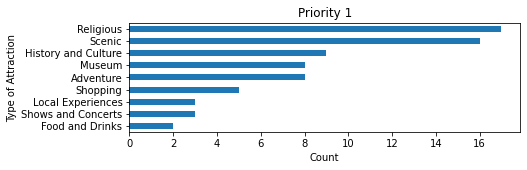

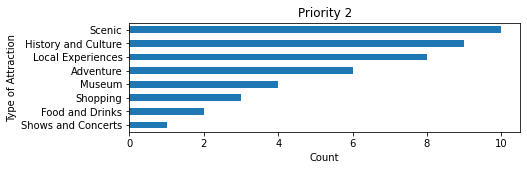

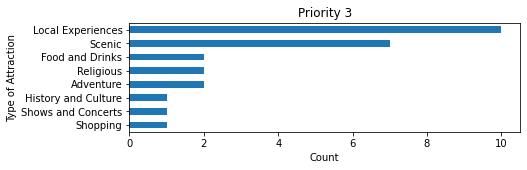

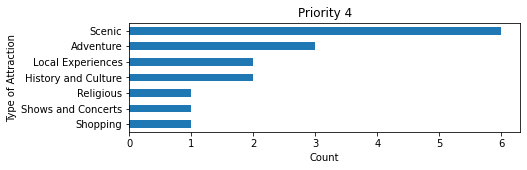

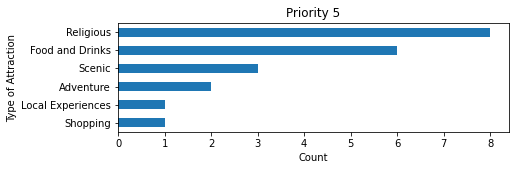

In [28]:
fig = plt.figure()

plt.subplots()
ax1 = df_types['PRIORITY_1'].value_counts().sort_values(ascending=True).plot(figsize = (7,2),
                                              kind = 'barh')
ax1.set_xlabel('Count')
ax1.set_ylabel('Type of Attraction')
ax1.set_title('Priority 1')

plt.subplots()
ax2 = df_types['PRIORITY_2'].value_counts().sort_values(ascending=True).plot(figsize =(7,2),
                                                kind = 'barh')
ax2.set_xlabel('Count')
ax2.set_ylabel('Type of Attraction')
ax2.set_title('Priority 2')

plt.subplots()
ax2 = df_types['PRIORITY_3'].value_counts().sort_values(ascending=True).plot(figsize =(7,2),
                                                kind = 'barh')
ax2.set_xlabel('Count')
ax2.set_ylabel('Type of Attraction')
ax2.set_title('Priority 3')

plt.subplots()
ax2 = df_types['PRIORITY_4'].value_counts().sort_values(ascending=True).plot(figsize =(7,2),
                                                kind = 'barh')
ax2.set_xlabel('Count')
ax2.set_ylabel('Type of Attraction')
ax2.set_title('Priority 4')

plt.subplots()
ax2 = df_types['PRIORITY_5'].value_counts().sort_values(ascending=True).plot(figsize =(7,2),
                                                kind = 'barh')
ax2.set_xlabel('Count')
ax2.set_ylabel('Type of Attraction')
ax2.set_title('Priority 5')


plt.show()

In [29]:
column_wordcloud = df_types[df_types.columns[2:]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

In [30]:
column_wordcloud

0     History and Culture,Museum,Local Experiences,S...
1     History and Culture,Museum,Local Experiences,S...
2                            History and Culture,Museum
3          History and Culture,Local Experiences,Scenic
4                     Museum,History and Culture,Scenic
                            ...                        
66                                            Adventure
67                         Religious,Shows and Concerts
68                             Shopping,Food and Drinks
69                           Adventure,Scenic,Religious
70                   Adventure,Scenic,Local Experiences
Length: 71, dtype: object

In [31]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40, 30))
    plt.imshow(wordcloud) 
    plt.axis("off");

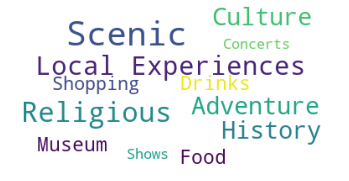

In [32]:
wordcloud = WordCloud(
                          background_color='white',
                          max_words=40,
                          max_font_size=40, 
                          random_state=1
                         ).generate(' '.join(column_wordcloud))
print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()
fig.savefig("word1.png", dpi=900)


# Geospatial Analysis

Hotel and Tourist Attractions Distribution using Streamlit

In [ ]:
%%writefile distribution_places.py

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from datetime import datetime #for manipulating dates and times
import datetime
import streamlit as st #to do interactive visualisation
import folium #Visualize data on map
from streamlit_folium import folium_static #link streamlit with folium
from pyngrok import ngrok #provides a real-time web UI 

#Setting up the Dashboard
st.set_page_config(layout = "wide")
st.title('Distribution of Tourist Attractions and Hotels in Jaipur') 
st.sidebar.subheader('Choose Type(s) of Tourist Attraction')

#Assigning the Data
df_places = pd.read_csv ('Places.csv')
df_hotels = pd.read_csv ('Hotels.csv')
df_types = pd.read_csv('Types.csv')

#Replace '-' with NaN
df_places = df_places.replace('-',np.nan)
df_hotels = df_hotels.replace('-',np.nan)
df_types = df_types.replace('-',np.nan)

#Merge places dan types Data
df_merged =  pd.merge(df_places, df_types , on=["PID",'POIs'], how ='inner')

#Transform columns into datetime
df_merged['IN-TIME1'] = pd.to_datetime(df_merged['IN-TIME1'], format='%H:%M').dt.time
df_merged['OUT-TIME1'] = pd.to_datetime(df_merged['OUT-TIME1'], format='%H:%M').dt.time
df_merged['IN-TIME2'] = pd.to_datetime(df_merged['IN-TIME2'], format='%H:%M').dt.time
df_merged['OUT-TIME2'] = pd.to_datetime(df_merged['OUT-TIME2'], format='%H:%M').dt.time

#Assign min and max IN-TIME1 and OUT-TIME1 for slider of Opening Hours
min_hour = min(df_merged["IN-TIME1"]) 
max_hour = max(df_merged["OUT-TIME1"]) 

#Creating checkboxes for types of tourist attraction and assigning it into variabel for if function
hiscul = st.sidebar.checkbox("History and Culture")
museum = st.sidebar.checkbox("Museum")
religious = st.sidebar.checkbox("Religious")
scenic = st.sidebar.checkbox("Scenic")
showcon = st.sidebar.checkbox("Shows and Concerts")
adventure = st.sidebar.checkbox("Adventure")
shopping = st.sidebar.checkbox("Shopping")
locex = st.sidebar.checkbox("Local Experiences")
fooddrinks = st.sidebar.checkbox("Food and Drinks")

#Creating a slider with min_hour and max_hour value
min_selection, max_selection = st.sidebar.slider(
    "Tourist Attractions Opening Hours", min_value=min_hour, max_value=max_hour, key = "1", value=[datetime.time(12,00),datetime.time(13,00)]
)

#Filter data by slider
df_merged = df_merged[
    (df_merged["IN-TIME1"] <= min_selection) & (df_merged["OUT-TIME1"] >= max_selection) | (df_merged["IN-TIME1"] <= min_selection) & (df_merged["OUT-TIME2"] >= max_selection)
]

#Assigning DatViz on Map
m = folium.Map(location=[26.922070, 75.778885], zoom_start=9,tiles='openstreetmap')

#if function for the checkboxes
if hiscul:
    for lat, lon, name, intime1, outtime1,intime2, outtime2 in zip(df_merged[df_merged['PRIORITY_1'] == 'History and Culture']['LATITUDE'], df_merged[df_merged['PRIORITY_1'] == 'History and Culture']['LONGITUDE'], df_merged[df_merged['PRIORITY_1'] == 'History and Culture']['POIs'],df_merged[df_merged['PRIORITY_1'] == 'History and Culture']['IN-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'History and Culture']['OUT-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'History and Culture']['IN-TIME2'],df_merged[df_merged['PRIORITY_1'] == 'History and Culture']['OUT-TIME2']):       
        folium.Marker([lat, lon],
                        popup = ('<strong>Name:</strong>: ' + str(name) + '<br>'
                                '<strong>Opening Time 1</strong>: ' + str(intime1) + '<br>'
                                '<strong>Closing Time 1</strong>: ' + str(outtime1) + '<br>'
                                '<strong>Opening Time 2</strong>: ' + str(intime2) + '<br>'
                                '<strong>Closing Time 2</strong>: ' + str(outtime2) + '<br>')).add_to(m)

if museum:
    for lat, lon, name, intime1, outtime1,intime2, outtime2 in zip(df_merged[df_merged['PRIORITY_1'] == 'Museum']['LATITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Museum']['LONGITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Museum']['POIs'],df_merged[df_merged['PRIORITY_1'] == 'Museum']['IN-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Museum']['OUT-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Museum']['IN-TIME2'],df_merged[df_merged['PRIORITY_1'] == 'Museum']['OUT-TIME2']):       
        folium.Marker([lat, lon],
                        popup = ('<strong>Name:</strong>: ' + str(name) + '<br>'
                                '<strong>Opening Time 1</strong>: ' + str(intime1) + '<br>'
                                '<strong>Closing Time 1</strong>: ' + str(outtime1) + '<br>'
                                '<strong>Opening Time 2</strong>: ' + str(intime2) + '<br>'
                                '<strong>Closing Time 2</strong>: ' + str(outtime2) + '<br>')).add_to(m)
        
if religious:
    for lat, lon, name, intime1, outtime1,intime2, outtime2 in zip(df_merged[df_merged['PRIORITY_1'] == 'Religious']['LATITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Religious']['LONGITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Religious']['POIs'],df_merged[df_merged['PRIORITY_1'] == 'Religious']['IN-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Religious']['OUT-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Religious']['IN-TIME2'],df_merged[df_merged['PRIORITY_1'] == 'Religious']['OUT-TIME2']):       
        folium.Marker([lat, lon],
                        popup = ('<strong>Name:</strong>: ' + str(name) + '<br>'
                                '<strong>Opening Time 1</strong>: ' + str(intime1) + '<br>'
                                '<strong>Closing Time 1</strong>: ' + str(outtime1) + '<br>'
                                '<strong>Opening Time 2</strong>: ' + str(intime2) + '<br>'
                                '<strong>Closing Time 2</strong>: ' + str(outtime2) + '<br>')).add_to(m)
        
if scenic:
    for lat, lon, name, intime1, outtime1,intime2, outtime2 in zip(df_merged[df_merged['PRIORITY_1'] == 'Scenic']['LATITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Scenic']['LONGITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Scenic']['POIs'],df_merged[df_merged['PRIORITY_1'] == 'Scenic']['IN-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Scenic']['OUT-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Scenic']['IN-TIME2'],df_merged[df_merged['PRIORITY_1'] == 'Scenic']['OUT-TIME2']):       
        folium.Marker([lat, lon],
                        popup = ('<strong>Name:</strong>: ' + str(name) + '<br>'
                                '<strong>Opening Time 1</strong>: ' + str(intime1) + '<br>'
                                '<strong>Closing Time 1</strong>: ' + str(outtime1) + '<br>'
                                '<strong>Opening Time 2</strong>: ' + str(intime2) + '<br>'
                                '<strong>Closing Time 2</strong>: ' + str(outtime2) + '<br>')).add_to(m)
        
if showcon:
    for lat, lon, name, intime1, outtime1,intime2, outtime2 in zip(df_merged[df_merged['PRIORITY_1'] == 'Shows and Concerts']['LATITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Shows and Concerts']['LONGITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Shows and Concerts']['POIs'],df_merged[df_merged['PRIORITY_1'] == 'Shows and Concerts']['IN-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Shows and Concerts']['OUT-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Shows and Concerts']['IN-TIME2'],df_merged[df_merged['PRIORITY_1'] == 'Shows and Concerts']['OUT-TIME2']):       
        folium.Marker([lat, lon],
                        popup = ('<strong>Name:</strong>: ' + str(name) + '<br>'
                                '<strong>Opening Time 1</strong>: ' + str(intime1) + '<br>'
                                '<strong>Closing Time 1</strong>: ' + str(outtime1) + '<br>'
                                '<strong>Opening Time 2</strong>: ' + str(intime2) + '<br>'
                                '<strong>Closing Time 2</strong>: ' + str(outtime2) + '<br>')).add_to(m)
        
if adventure:
    for lat, lon, name, intime1, outtime1,intime2, outtime2 in zip(df_merged[df_merged['PRIORITY_1'] == 'Adventure']['LATITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Adventure']['LONGITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Adventure']['POIs'],df_merged[df_merged['PRIORITY_1'] == 'Adventure']['IN-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Adventure']['OUT-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Adventure']['IN-TIME2'],df_merged[df_merged['PRIORITY_1'] == 'Adventure']['OUT-TIME2']):       
        folium.Marker([lat, lon],
                        popup = ('<strong>Name:</strong>: ' + str(name) + '<br>'
                                '<strong>Opening Time 1</strong>: ' + str(intime1) + '<br>'
                                '<strong>Closing Time 1</strong>: ' + str(outtime1) + '<br>'
                                '<strong>Opening Time 2</strong>: ' + str(intime2) + '<br>'
                                '<strong>Closing Time 2</strong>: ' + str(outtime2) + '<br>')).add_to(m)

if shopping:
    for lat, lon, name, intime1, outtime1,intime2, outtime2 in zip(df_merged[df_merged['PRIORITY_1'] == 'Shopping']['LATITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Shopping']['LONGITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Shopping']['POIs'],df_merged[df_merged['PRIORITY_1'] == 'Shopping']['IN-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Shopping']['OUT-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Shopping']['IN-TIME2'],df_merged[df_merged['PRIORITY_1'] == 'Shopping']['OUT-TIME2']):       
        folium.Marker([lat, lon],
                        popup = ('<strong>Name:</strong>: ' + str(name) + '<br>'
                                '<strong>Opening Time 1</strong>: ' + str(intime1) + '<br>'
                                '<strong>Closing Time 1</strong>: ' + str(outtime1) + '<br>'
                                '<strong>Opening Time 2</strong>: ' + str(intime2) + '<br>'
                                '<strong>Closing Time 2</strong>: ' + str(outtime2) + '<br>')).add_to(m)

if locex:
    for lat, lon, name, intime1, outtime1,intime2, outtime2 in zip(df_merged[df_merged['PRIORITY_1'] == 'Local Experiences']['LATITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Local Experiences']['LONGITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Local Experiences']['POIs'],df_merged[df_merged['PRIORITY_1'] == 'Local Experiences']['IN-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Local Experiences']['OUT-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Local Experiences']['IN-TIME2'],df_merged[df_merged['PRIORITY_1'] == 'Local Experiences']['OUT-TIME2']):       
        folium.Marker([lat, lon],
                        popup = ('<strong>Name:</strong>: ' + str(name) + '<br>'
                                '<strong>Opening Time 1</strong>: ' + str(intime1) + '<br>'
                                '<strong>Closing Time 1</strong>: ' + str(outtime1) + '<br>'
                                '<strong>Opening Time 2</strong>: ' + str(intime2) + '<br>'
                                '<strong>Closing Time 2</strong>: ' + str(outtime2) + '<br>')).add_to(m)
        
if fooddrinks:
    for lat, lon, name, intime1, outtime1,intime2, outtime2 in zip(df_merged[df_merged['PRIORITY_1'] == 'Food and Drinks']['LATITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Food and Drinks']['LONGITUDE'], df_merged[df_merged['PRIORITY_1'] == 'Food and Drinks']['POIs'],df_merged[df_merged['PRIORITY_1'] == 'Food and Drinks']['IN-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Food and Drinks']['OUT-TIME1'],df_merged[df_merged['PRIORITY_1'] == 'Food and Drinks']['IN-TIME2'],df_merged[df_merged['PRIORITY_1'] == 'Food and Drinks']['OUT-TIME2']):       
        folium.Marker([lat, lon],
                        popup = ('<strong>Name:</strong>: ' + str(name) + '<br>'
                                '<strong>Opening Time 1</strong>: ' + str(intime1) + '<br>'
                                '<strong>Closing Time 1</strong>: ' + str(outtime1) + '<br>'
                                '<strong>Opening Time 2</strong>: ' + str(intime2) + '<br>'
                                '<strong>Closing Time 2</strong>: ' + str(outtime2) + '<br>')).add_to(m)

#Creating radio buttons
radio_options = ['Yes', 'No']
radio_hotel = st.sidebar.radio('Show Hotels?', radio_options, index = 1)

#Assign min and max PRICE RUPEES for slider of price range
min_price = min(df_hotels['PRICE_RUPEES'])
max_price = max(df_hotels['PRICE_RUPEES'])

#Categorizing popularity into 3 Categories based on its quantiles
df_hotels['Popularity'] = pd.qcut(df_hotels['NUMBER_OF_REVIEWS'][df_hotels['NUMBER_OF_REVIEWS']>0], 
                                  q=[0, .25, .75, 1], labels=['Low', 'Moderate', 'High']).astype("object")

#if function for radio buttons
if radio_hotel == 'Yes':
    #Creating slider of Price Range
    min_price_selection,max_price_selection = st.sidebar.slider('Price Range Per Night, Per Room (in Rupees)', min_value = min_price, max_value = max_price, key="2", value = [min_price,max_price])
    #Filtering data by slider
    df_hotels = df_hotels[(df_hotels['PRICE_RUPEES'] >= min_price_selection) & (df_hotels['PRICE_RUPEES'] <= max_price_selection)]
    #Creating checkboxes for Popularity
    pop_low= st.sidebar.checkbox("Low", value = True)
    pop_moderate = st.sidebar.checkbox("Moderate", value = True)
    pop_high = st.sidebar.checkbox("High", value = True)
    #if functions for checkboxes of popularity
    if pop_low:
        for hid, hotel, price, reviews, lat, long, pop in zip(df_hotels[df_hotels['Popularity'] == 'Low']['HID'], df_hotels[df_hotels['Popularity'] == 'Low']['HOTEL'], df_hotels[df_hotels['Popularity'] == 'Low']['PRICE_RUPEES'], df_hotels[df_hotels['Popularity'] == 'Low']['NUMBER_OF_REVIEWS'],df_hotels[df_hotels['Popularity'] == 'Low']['Lat'],df_hotels[df_hotels['Popularity'] == 'Low']['Lng'],df_hotels[df_hotels['Popularity'] == 'Low']['Popularity']):
            folium.Marker([lat, long],
                        popup = ('<Strong>Name:</strong> ' + str(hotel) + '<br>'
                             '<strong>Price:</strong> ' + str(price) + '<br>'
                             '<strong>Number of Reviews:</strong> ' + str(reviews) + '<br>'),
                          icon=folium.Icon(color="red",icon="hotel", prefix='fa')).add_to(m)
    if pop_moderate:
        for hid, hotel, price, reviews, lat, long, pop in zip(df_hotels[df_hotels['Popularity'] == 'Moderate']['HID'], df_hotels[df_hotels['Popularity'] == 'Moderate']['HOTEL'], df_hotels[df_hotels['Popularity'] == 'Moderate']['PRICE_RUPEES'], df_hotels[df_hotels['Popularity'] == 'Moderate']['NUMBER_OF_REVIEWS'],df_hotels[df_hotels['Popularity'] == 'Moderate']['Lat'],df_hotels[df_hotels['Popularity'] == 'Moderate']['Lng'],df_hotels[df_hotels['Popularity'] == 'Moderate']['Popularity']):
            folium.Marker([lat, long],
                        popup = ('<Strong>Name:</strong> ' + str(hotel) + '<br>'
                             '<strong>Price:</strong> ' + str(price) + '<br>'
                             '<strong>Number of Reviews:</strong> ' + str(reviews) + '<br>'),
                          icon=folium.Icon(color="red",icon="hotel", prefix='fa')).add_to(m)
    if pop_high:
        for hid, hotel, price, reviews, lat, long, pop in zip(df_hotels[df_hotels['Popularity'] == 'High']['HID'], df_hotels[df_hotels['Popularity'] == 'High']['HOTEL'], df_hotels[df_hotels['Popularity'] == 'High']['PRICE_RUPEES'], df_hotels[df_hotels['Popularity'] == 'High']['NUMBER_OF_REVIEWS'],df_hotels[df_hotels['Popularity'] == 'High']['Lat'],df_hotels[df_hotels['Popularity'] == 'High']['Lng'],df_hotels[df_hotels['Popularity'] == 'High']['Popularity']):
            folium.Marker([lat, long],
                        popup = ('<Strong>Name:</strong> ' + str(hotel) + '<br>'
                             '<strong>Price:</strong> ' + str(price) + '<br>'
                             '<strong>Number of Reviews:</strong> ' + str(reviews) + '<br>'),
                          icon=folium.Icon(color="red",icon="hotel", prefix='fa')).add_to(m)
            
folium_static(m, width = 1600, height = 950)


In [ ]:
public_url2 = ngrok.connect('8501')
public_url2

In [2]:
#take polygon geojson of Jaipur from github
zone = gpd.read_file("https://raw.githubusercontent.com/datameet/Municipal_Spatial_Data/master/Jaipur/Jaipur_Zones.geojson")

In [3]:
zone.head()

,OBJECTID,Zone_Name,Total_Ward,Shape_Leng,Shape_Le_1,Shape_Area,geometry
0,1,ADARSH NAGAR,9,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689..."
1,2,AMER ANSIK,1,20062.756279,0.169816,0.001711,"POLYGON ((75.88071 26.95447, 75.88058 26.95450..."
2,3,BAGRU ANSIK,4,54439.858944,0.463404,0.007102,"POLYGON ((75.90057 26.87682, 75.90065 26.87643..."
3,4,CIVIL LINES,9,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081..."
4,5,HAWA MAHAL,10,39950.187426,0.344536,0.002348,"POLYGON ((75.80193 26.96498, 75.80302 26.96482..."


<AxesSubplot:>

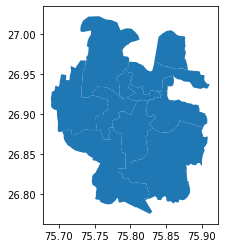

In [4]:
#plot the polygon
zone.plot()

In [5]:
zone ['city'] = 'Jaipur'
jaipur = zone[['city', 'geometry']].dissolve(by='city')
jaipur

,geometry
city,
Jaipur,"POLYGON ((75.82279 26.78933, 75.82399 26.78760..."


<AxesSubplot:>

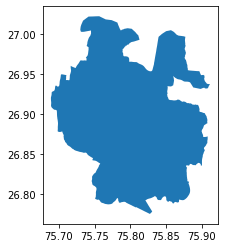

In [6]:
jaipur.plot()

In [7]:
df_places = pd.read_csv ('Places.csv')
df_hotels = pd.read_csv ('Hotels.csv')
df_types = pd.read_csv('Types.csv')
df_merged =  pd.merge(df_places, df_types , on=["PID",'POIs'], how ='inner')

In [8]:
df_hotels.head()

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng
0,HID1,HOTEL ANURAAG VILLA JAIPUR,898.92,1305,26.927230,75.789207
1,HID2,HILTON JAIPUR,2771.67,4358,26.973697,75.844382
2,HID3,"TRIDENT, JAIPUR",4120.05,499,26.957344,75.842886
3,HID4,THE FERN RESIDENCY JAIPUR,2172.39,278,26.874359,75.816421
4,HID5,"ITC RAJPUTANA, JAIPUR A LUXURY COLLECTION HOTE...",3221.13,6189,26.919313,75.791175


In [9]:
geo_hotel = gpd.GeoDataFrame(df_hotels,crs='epsg:4326',geometry=gpd.points_from_xy(df_hotels.Lng, df_hotels.Lat))
geo_hotel.head()

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng,geometry
0,HID1,HOTEL ANURAAG VILLA JAIPUR,898.92,1305,26.927230,75.789207,POINT (75.78921 26.92723)
1,HID2,HILTON JAIPUR,2771.67,4358,26.973697,75.844382,POINT (75.84438 26.97370)
2,HID3,"TRIDENT, JAIPUR",4120.05,499,26.957344,75.842886,POINT (75.84289 26.95734)
3,HID4,THE FERN RESIDENCY JAIPUR,2172.39,278,26.874359,75.816421,POINT (75.81642 26.87436)
4,HID5,"ITC RAJPUTANA, JAIPUR A LUXURY COLLECTION HOTE...",3221.13,6189,26.919313,75.791175,POINT (75.79117 26.91931)


### Geospatial Analysis : Analyzing and cleaning Hotel outside Jaipur

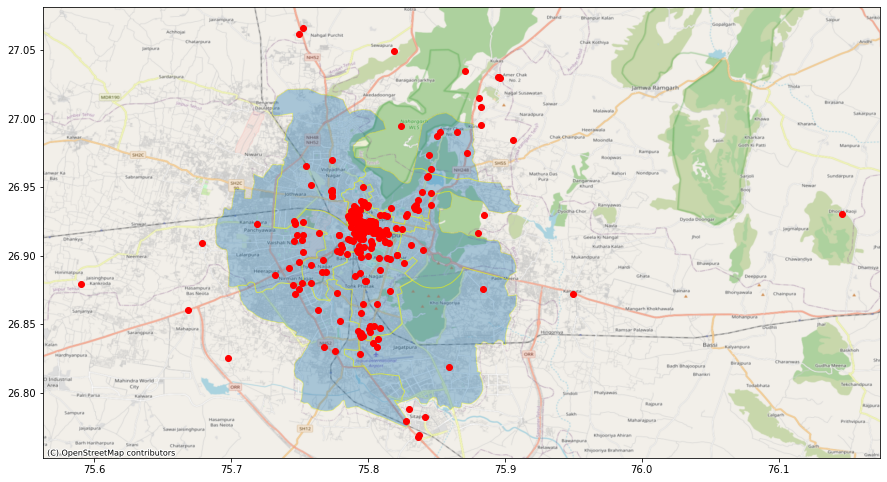

In [10]:
ax = zone['geometry'].plot(alpha=0.35, figsize =(15,15),edgecolor= "yellow", linewidth = 1)
geo_hotel.plot(ax=ax, color = 'red')
cx.add_basemap(ax, crs=jaipur.crs.to_string(), source = cx.providers.OpenStreetMap.Mapnik)
plt.show()

It seems there are several hotels outside Jaipur City, we will remove it so that the analysis could be focused on Jaipur

In [11]:
adarsh = zone.loc[zone['Zone_Name']== 'ADARSH NAGAR']
adarsh.reset_index(drop=True, inplace=True)
adarsh.head()

,OBJECTID,Zone_Name,Total_Ward,Shape_Leng,Shape_Le_1,Shape_Area,geometry,city
0,1,ADARSH NAGAR,9,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur


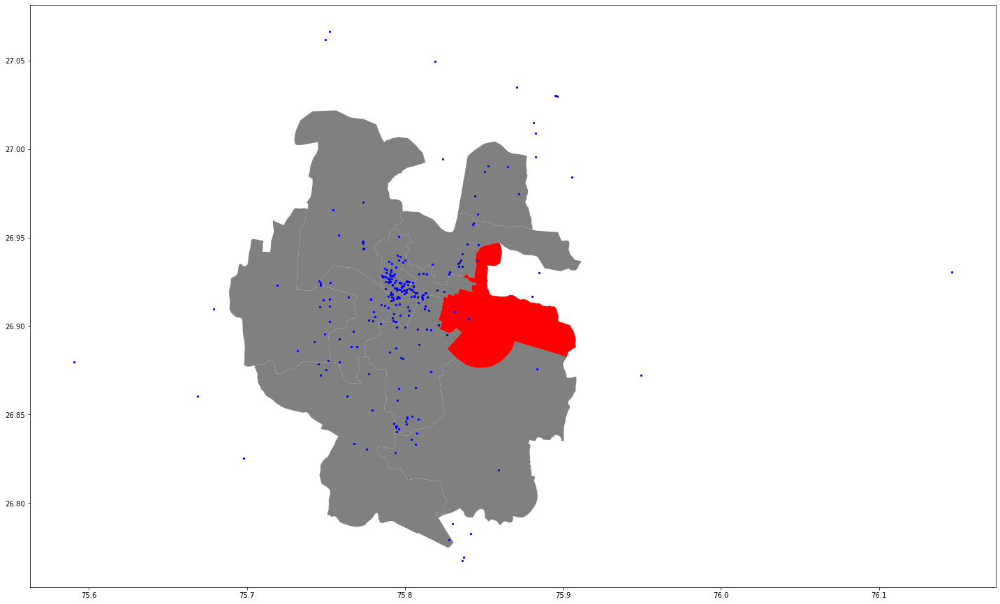

In [12]:
# Create a figure with one subplot
fig, ax = plt.subplots(figsize = (20,20))

# Plot polygons
zone.plot(ax=ax, facecolor='gray')
adarsh.plot(ax=ax, facecolor='red')

# Plot points
geo_hotel.plot(ax=ax, color = 'blue', markersize=5)

plt.tight_layout()

In [13]:
#create mask of adarsh neighborhood
adarsh_mask = geo_hotel.within(adarsh.at[0, 'geometry'])
adarsh_mask.value_counts()

False    251
True       3
dtype: int64

In [14]:
#filter only hotel inside Adarsh neighborhood
pip_adarsh = geo_hotel.loc[adarsh_mask]
pip_adarsh['Zone_Name'] = 'ADARSH NAGAR'

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [15]:
pip_adarsh

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng,geometry,Zone_Name
184,HID185,SNEH DEEP GUEST HOUSE JAIPUR,824.01,119,26.904157,75.840226,POINT (75.84023 26.90416),ADARSH NAGAR
196,HID197,ABHI ROOMS JAIPUR,749.10,8,26.908059,75.831676,POINT (75.83168 26.90806),ADARSH NAGAR
215,HID216,HOTEL SURYA GARH JAIPUR,3069.00,100,26.936874,75.846184,POINT (75.84618 26.93687),ADARSH NAGAR


In [16]:
#repeat it 9 times with another neighborhood
amer = zone.loc[zone['Zone_Name']== 'AMER ANSIK']
amer.reset_index(drop=True, inplace=True)
amer_mask = geo_hotel.within(amer.at[0, 'geometry'])
pip_amer = geo_hotel.loc[amer_mask]
pip_amer['Zone_Name'] = 'AMER ANSIK'

bagru = zone.loc[zone['Zone_Name']== 'BAGRU ANSIK']
bagru.reset_index(drop=True, inplace=True)
bagru_mask = geo_hotel.within(bagru.at[0, 'geometry'])
pip_bagru = geo_hotel.loc[bagru_mask]
pip_bagru['Zone_Name'] = 'BAGRU ANSIK'

civil = zone.loc[zone['Zone_Name']== 'CIVIL LINES']
civil.reset_index(drop=True, inplace=True)
civil_mask = geo_hotel.within(civil.at[0, 'geometry'])
pip_civil = geo_hotel.loc[civil_mask]
pip_civil['Zone_Name'] = 'CIVIL LINES'

hawa = zone.loc[zone['Zone_Name']== 'HAWA MAHAL']
hawa.reset_index(drop=True, inplace=True)
hawa_mask = geo_hotel.within(hawa.at[0, 'geometry'])
pip_hawa = geo_hotel.loc[hawa_mask]
pip_hawa['Zone_Name'] = 'HAWA MAHAL'

jhotwara = zone.loc[zone['Zone_Name']== 'JHOTWARA ANSIK']
jhotwara.reset_index(drop=True, inplace=True)
jhotwara_mask = geo_hotel.within(jhotwara.at[0, 'geometry'])
pip_jhotwara = geo_hotel.loc[jhotwara_mask]
pip_jhotwara['Zone_Name'] = 'JHOTWARA ANSIK'

kishan = zone.loc[zone['Zone_Name']== 'KISHAN POLE']
kishan.reset_index(drop=True, inplace=True)
kishan_mask = geo_hotel.within(kishan.at[0, 'geometry'])
pip_kishan = geo_hotel.loc[kishan_mask]
pip_kishan['Zone_Name'] = 'KISHAN POLE'

malviya = zone.loc[zone['Zone_Name']== 'MALVIYA NAGAR']
malviya.reset_index(drop=True, inplace=True)
malviya_mask = geo_hotel.within(malviya.at[0, 'geometry'])
pip_malviya = geo_hotel.loc[malviya_mask]
pip_malviya['Zone_Name'] = 'MALVIYA NAGAR'

sanganer = zone.loc[zone['Zone_Name']== 'SANGANER']
sanganer.reset_index(drop=True, inplace=True)
sanganer_mask = geo_hotel.within(sanganer.at[0, 'geometry'])
pip_sanganer = geo_hotel.loc[sanganer_mask]
pip_sanganer['Zone_Name'] = 'SANGANER'

vidhyadhar = zone.loc[zone['Zone_Name']== 'VIDHYADHAR NAGAR']
vidhyadhar.reset_index(drop=True, inplace=True)
vidhyadhar_mask = geo_hotel.within(vidhyadhar.at[0, 'geometry'])
pip_vidhyadhar = geo_hotel.loc[vidhyadhar_mask]
pip_vidhyadhar['Zone_Name'] = 'VIDHYADHAR NAGAR'

merged = pip_adarsh.append([pip_amer, pip_bagru, pip_civil, pip_hawa, pip_jhotwara, pip_kishan, pip_malviya, pip_sanganer, pip_vidhyadhar]).sort_index()

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [17]:
merged

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng,geometry,Zone_Name
0,HID1,HOTEL ANURAAG VILLA JAIPUR,898.92,1305,26.927230,75.789207,POINT (75.78921 26.92723),CIVIL LINES
1,HID2,HILTON JAIPUR,2771.67,4358,26.973697,75.844382,POINT (75.84438 26.97370),AMER ANSIK
2,HID3,"TRIDENT, JAIPUR",4120.05,499,26.957344,75.842886,POINT (75.84289 26.95734),HAWA MAHAL
3,HID4,THE FERN RESIDENCY JAIPUR,2172.39,278,26.874359,75.816421,POINT (75.81642 26.87436),MALVIYA NAGAR
4,HID5,"ITC RAJPUTANA, JAIPUR A LUXURY COLLECTION HOTE...",3221.13,6189,26.919313,75.791175,POINT (75.79117 26.91931),CIVIL LINES
...,...,...,...,...,...,...,...,...
249,HID250,COMFORT INN SAPPHIRE JAIPUR,2771.67,130,26.917760,75.811170,POINT (75.81117 26.91776),KISHAN POLE
250,HID251,HOUSETEL JAIPUR,674.19,44,26.906001,75.802107,POINT (75.80211 26.90600),CIVIL LINES
251,HID252,GIRISADAN HOMESTAY JAIPUR,4494.60,238,26.912570,75.796529,POINT (75.79653 26.91257),CIVIL LINES
252,HID253,THE HOSTELLER JAIPUR,449.00,143,26.918242,75.799674,POINT (75.79967 26.91824),KISHAN POLE


In [18]:
geo_hotel = pd.merge(merged, zone, on="Zone_Name")

In [19]:
del geo_hotel['Total_Ward'], geo_hotel['OBJECTID']

In [20]:
geo_hotel = geo_hotel.rename(columns = {'geometry_x': 'geometry_hotel', 'geometry_y': 'geometry_zone'}, inplace = False)

In [21]:
geo_hotel

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng,geometry_hotel,Zone_Name,Shape_Leng,Shape_Le_1,Shape_Area,geometry_zone,city
0,HID1,HOTEL ANURAAG VILLA JAIPUR,898.92,1305,26.927230,75.789207,POINT (75.78921 26.92723),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
1,HID5,"ITC RAJPUTANA, JAIPUR A LUXURY COLLECTION HOTE...",3221.13,6189,26.919313,75.791175,POINT (75.79117 26.91931),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
2,HID6,HOLIDAY INN JAIPUR CITY CENTRE JAIPUR,4644.42,4392,26.902940,75.792486,POINT (75.79249 26.90294),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
3,HID9,UMAID BHAWAN HERITAGE HOUSE HOTEL JAIPUR,4045.14,3971,26.928506,75.792419,POINT (75.79242 26.92851),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
4,HID10,PEARL PALACE HERITAGE JAIPUR,1722.93,1467,26.915911,75.792374,POINT (75.79237 26.91591),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,HID228,BRANSON BACKPACKER HOMESTAY JAIPUR,1198.56,50,26.965494,75.754452,POINT (75.75445 26.96549),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur
226,HID231,HOTEL LIBRA JAIPUR,1498.20,184,26.946934,75.773664,POINT (75.77366 26.94693),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur
227,HID185,SNEH DEEP GUEST HOUSE JAIPUR,824.01,119,26.904157,75.840226,POINT (75.84023 26.90416),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur
228,HID197,ABHI ROOMS JAIPUR,749.10,8,26.908059,75.831676,POINT (75.83168 26.90806),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur


In [22]:
geo_hotel

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng,geometry_hotel,Zone_Name,Shape_Leng,Shape_Le_1,Shape_Area,geometry_zone,city
0,HID1,HOTEL ANURAAG VILLA JAIPUR,898.92,1305,26.927230,75.789207,POINT (75.78921 26.92723),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
1,HID5,"ITC RAJPUTANA, JAIPUR A LUXURY COLLECTION HOTE...",3221.13,6189,26.919313,75.791175,POINT (75.79117 26.91931),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
2,HID6,HOLIDAY INN JAIPUR CITY CENTRE JAIPUR,4644.42,4392,26.902940,75.792486,POINT (75.79249 26.90294),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
3,HID9,UMAID BHAWAN HERITAGE HOUSE HOTEL JAIPUR,4045.14,3971,26.928506,75.792419,POINT (75.79242 26.92851),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
4,HID10,PEARL PALACE HERITAGE JAIPUR,1722.93,1467,26.915911,75.792374,POINT (75.79237 26.91591),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,HID228,BRANSON BACKPACKER HOMESTAY JAIPUR,1198.56,50,26.965494,75.754452,POINT (75.75445 26.96549),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur
226,HID231,HOTEL LIBRA JAIPUR,1498.20,184,26.946934,75.773664,POINT (75.77366 26.94693),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur
227,HID185,SNEH DEEP GUEST HOUSE JAIPUR,824.01,119,26.904157,75.840226,POINT (75.84023 26.90416),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur
228,HID197,ABHI ROOMS JAIPUR,749.10,8,26.908059,75.831676,POINT (75.83168 26.90806),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur


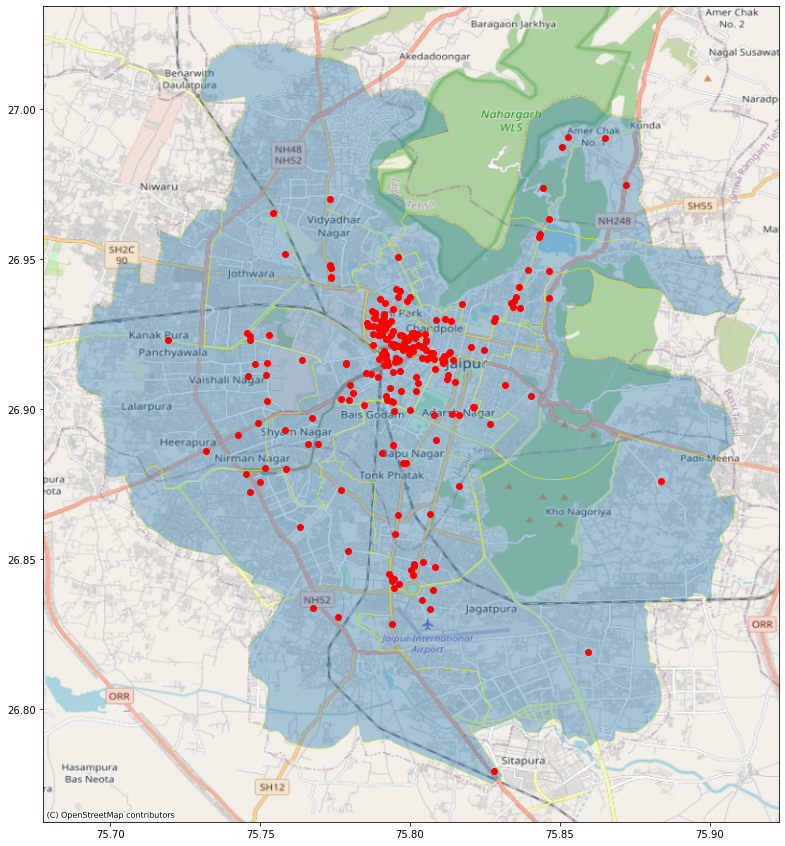

In [23]:
ax = zone['geometry'].plot(alpha=0.35, figsize =(15,15),edgecolor= "yellow", linewidth = 1)
geo_hotel['geometry_hotel'].plot(ax=ax, color = 'red')
cx.add_basemap(ax, crs=jaipur.crs.to_string(), source = cx.providers.OpenStreetMap.Mapnik)
plt.show()

In [24]:
geo_places = gpd.GeoDataFrame(df_merged,crs='epsg:4326',geometry=gpd.points_from_xy(df_merged.LONGITUDE, df_merged.LATITUDE))
geo_places.head()

,PID,POIs,LATITUDE,LONGITUDE,IN-TIME1,IN-TIME2,OUT-TIME1,OUT-TIME2,PRIORITY_1,PRIORITY_2,PRIORITY_3,PRIORITY_4,PRIORITY_5,geometry
0,POI1,AMBER PALACE,26.985487,75.851345,10:00,18:30,17:00,21:15,History and Culture,Museum,Local Experiences,Scenic,Adventure,POINT (75.85135 26.98549)
1,POI2,CITY PALACE JAIPUR,26.925771,75.823658,9:30,-,17:00,-,History and Culture,Museum,Local Experiences,Scenic,Food and Drinks,POINT (75.82366 26.92577)
2,POI3,JANTAR MANTAR JAIPUR,26.924762,75.824560,9:00,-,17:00,-,History and Culture,Museum,-,-,-,POINT (75.82456 26.92476)
3,POI4,HAWA MAHAL,26.923936,75.826744,9:00,-,16:30,-,History and Culture,-,Local Experiences,Scenic,-,POINT (75.82674 26.92394)
4,POI5,ALBERT HALL MUSEUM (CENTRAL MUSEUM),26.911576,75.819487,9:00,19:00,17:00,22:00,Museum,History and Culture,Scenic,-,-,POINT (75.81949 26.91158)


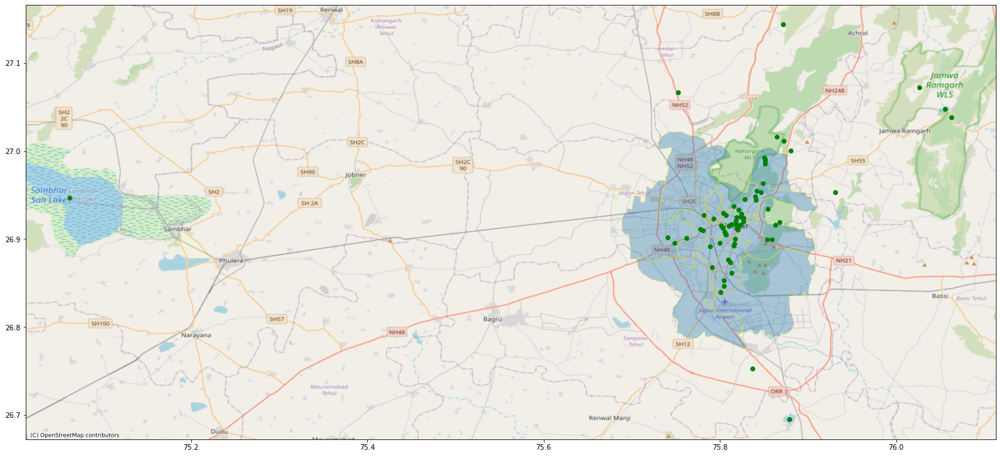

In [25]:
ax = zone['geometry'].plot(alpha=0.35, figsize =(25,25),edgecolor= "yellow", linewidth = 1)
geo_places.plot(ax=ax, color = 'green')
cx.add_basemap(ax, crs=jaipur.crs.to_string(), source = cx.providers.OpenStreetMap.Mapnik)
plt.show()

In [26]:
adarsh_mask_places = geo_places.within(adarsh.at[0, 'geometry'])
place_adarsh = geo_places.loc[adarsh_mask_places]
place_adarsh['Zone_Name'] = 'ADARSH NAGAR'

amer_mask_places = geo_places.within(amer.at[0, 'geometry'])
place_amer = geo_places.loc[amer_mask_places]
place_amer['Zone_Name'] = 'AMER ANSIK'

bagru_mask_places = geo_places.within(bagru.at[0, 'geometry'])
place_bagru = geo_places.loc[bagru_mask_places]
place_bagru['Zone_Name'] = 'BAGRU ANSIK'

civil_mask_places = geo_places.within(civil.at[0, 'geometry'])
place_civil = geo_places.loc[civil_mask_places]
place_civil['Zone_Name'] = 'CIVIL LINES'

hawa_mask_places = geo_places.within(hawa.at[0, 'geometry'])
place_hawa = geo_places.loc[hawa_mask_places]
place_hawa['Zone_Name'] = 'HAWA MAHAL'

jhotwara_mask_places = geo_places.within(jhotwara.at[0, 'geometry'])
place_jhotwara = geo_places.loc[jhotwara_mask_places]
place_jhotwara['Zone_Name'] = 'JHOTWARA ANSIK'

kishan_mask_places = geo_places.within(kishan.at[0, 'geometry'])
place_kishan = geo_places.loc[kishan_mask_places]
place_kishan['Zone_Name'] = 'KISHAN POLE'

malviya_mask_places = geo_places.within(malviya.at[0, 'geometry'])
place_malviya = geo_places.loc[malviya_mask_places]
place_malviya['Zone_Name'] = 'MALVIYA NAGAR'

sanganer_mask_places = geo_places.within(sanganer.at[0, 'geometry'])
place_sanganer = geo_places.loc[sanganer_mask_places]
place_sanganer['Zone_Name'] = 'SANGANER'

vidhyadhar_mask_places = geo_places.within(vidhyadhar.at[0, 'geometry'])
place_vidhyadhar = geo_places.loc[vidhyadhar_mask_places]
place_vidhyadhar['Zone_Name'] = 'VIDHYADHAR NAGAR'

place_merged = place_adarsh.append([place_amer, place_bagru, place_civil, place_hawa, place_jhotwara, place_kishan, place_malviya, place_sanganer, place_vidhyadhar]).sort_index()

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [27]:
geo_hotel = pd.merge(merged, zone, on="Zone_Name")

In [28]:
del geo_hotel['Total_Ward'], geo_hotel['OBJECTID']

In [29]:
geo_hotel = geo_hotel.rename(columns = {'geometry_x': 'geometry_hotel', 'geometry_y': 'geometry_zone'}, inplace = False)

In [30]:
geo_hotel

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng,geometry_hotel,Zone_Name,Shape_Leng,Shape_Le_1,Shape_Area,geometry_zone,city
0,HID1,HOTEL ANURAAG VILLA JAIPUR,898.92,1305,26.927230,75.789207,POINT (75.78921 26.92723),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
1,HID5,"ITC RAJPUTANA, JAIPUR A LUXURY COLLECTION HOTE...",3221.13,6189,26.919313,75.791175,POINT (75.79117 26.91931),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
2,HID6,HOLIDAY INN JAIPUR CITY CENTRE JAIPUR,4644.42,4392,26.902940,75.792486,POINT (75.79249 26.90294),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
3,HID9,UMAID BHAWAN HERITAGE HOUSE HOTEL JAIPUR,4045.14,3971,26.928506,75.792419,POINT (75.79242 26.92851),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
4,HID10,PEARL PALACE HERITAGE JAIPUR,1722.93,1467,26.915911,75.792374,POINT (75.79237 26.91591),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,HID228,BRANSON BACKPACKER HOMESTAY JAIPUR,1198.56,50,26.965494,75.754452,POINT (75.75445 26.96549),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur
226,HID231,HOTEL LIBRA JAIPUR,1498.20,184,26.946934,75.773664,POINT (75.77366 26.94693),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur
227,HID185,SNEH DEEP GUEST HOUSE JAIPUR,824.01,119,26.904157,75.840226,POINT (75.84023 26.90416),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur
228,HID197,ABHI ROOMS JAIPUR,749.10,8,26.908059,75.831676,POINT (75.83168 26.90806),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur


In [31]:
geo_places = pd.merge(place_merged, zone, on="Zone_Name")
del geo_places['Total_Ward'], geo_places['OBJECTID']
geo_places = geo_places.rename(columns = {'geometry_x': 'geometry_place', 'geometry_y': 'geometry_zone'}, inplace = False)
geo_places

,PID,POIs,LATITUDE,LONGITUDE,IN-TIME1,IN-TIME2,OUT-TIME1,OUT-TIME2,PRIORITY_1,PRIORITY_2,PRIORITY_3,PRIORITY_4,PRIORITY_5,geometry_place,Zone_Name,Shape_Leng,Shape_Le_1,Shape_Area,geometry_zone,city
0,POI1,AMBER PALACE,26.985487,75.851345,10:00,18:30,17:00,21:15,History and Culture,Museum,Local Experiences,Scenic,Adventure,POINT (75.85135 26.98549),AMER ANSIK,20062.756279,0.169816,0.001711,"POLYGON ((75.88071 26.95447, 75.88058 26.95450...",Jaipur
1,POI13,ANOKHI MUSEUM OF HAND PRINTING,26.992710,75.850776,10:30,-,17:00,-,Museum,History and Culture,Scenic,-,-,POINT (75.85078 26.99271),AMER ANSIK,20062.756279,0.169816,0.001711,"POLYGON ((75.88071 26.95447, 75.88058 26.95450...",Jaipur
2,POI21,KANAK VRINDAVAN,26.963622,75.848634,8:00,-,17:00,-,Scenic,Adventure,-,-,Religious,POINT (75.84863 26.96362),AMER ANSIK,20062.756279,0.169816,0.001711,"POLYGON ((75.88071 26.95447, 75.88058 26.95450...",Jaipur
3,POI29,JAGAT SHIROMANI TEMPLE,26.989059,75.851271,0:00,-,23:59,-,Religious,History and Culture,Scenic,-,-,POINT (75.85127 26.98906),AMER ANSIK,20062.756279,0.169816,0.001711,"POLYGON ((75.88071 26.95447, 75.88058 26.95450...",Jaipur
4,POI38,PANNA MEENA KI BAOLI,26.991105,75.851229,7:00,-,18:00,-,Scenic,History and Culture,-,-,-,POINT (75.85123 26.99111),AMER ANSIK,20062.756279,0.169816,0.001711,"POLYGON ((75.88071 26.95447, 75.88058 26.95450...",Jaipur
5,POI2,CITY PALACE JAIPUR,26.925771,75.823658,9:30,-,17:00,-,History and Culture,Museum,Local Experiences,Scenic,Food and Drinks,POINT (75.82366 26.92577),HAWA MAHAL,39950.187426,0.344536,0.002348,"POLYGON ((75.80193 26.96498, 75.80302 26.96482...",Jaipur
6,POI3,JANTAR MANTAR JAIPUR,26.924762,75.824560,9:00,-,17:00,-,History and Culture,Museum,-,-,-,POINT (75.82456 26.92476),HAWA MAHAL,39950.187426,0.344536,0.002348,"POLYGON ((75.80193 26.96498, 75.80302 26.96482...",Jaipur
7,POI6,NAHARGARH FORT,26.937313,75.815526,10:00,-,18:00,-,Museum,History and Culture,Scenic,Local Experiences,Food and Drinks,POINT (75.81553 26.93731),HAWA MAHAL,39950.187426,0.344536,0.002348,"POLYGON ((75.80193 26.96498, 75.80302 26.96482...",Jaipur
8,POI8,JAL MAHAL,26.953468,75.846138,12:00,-,22:30,-,History and Culture,Scenic,Local Experiences,Adventure,-,POINT (75.84614 26.95347),HAWA MAHAL,39950.187426,0.344536,0.002348,"POLYGON ((75.80193 26.96498, 75.80302 26.96482...",Jaipur
9,POI14,GOVIND DEVJI TEMPLE,26.928834,75.824070,4:30,17:45,11:30,21:30,Religious,Local Experiences,-,-,-,POINT (75.82407 26.92883),HAWA MAHAL,39950.187426,0.344536,0.002348,"POLYGON ((75.80193 26.96498, 75.80302 26.96482...",Jaipur


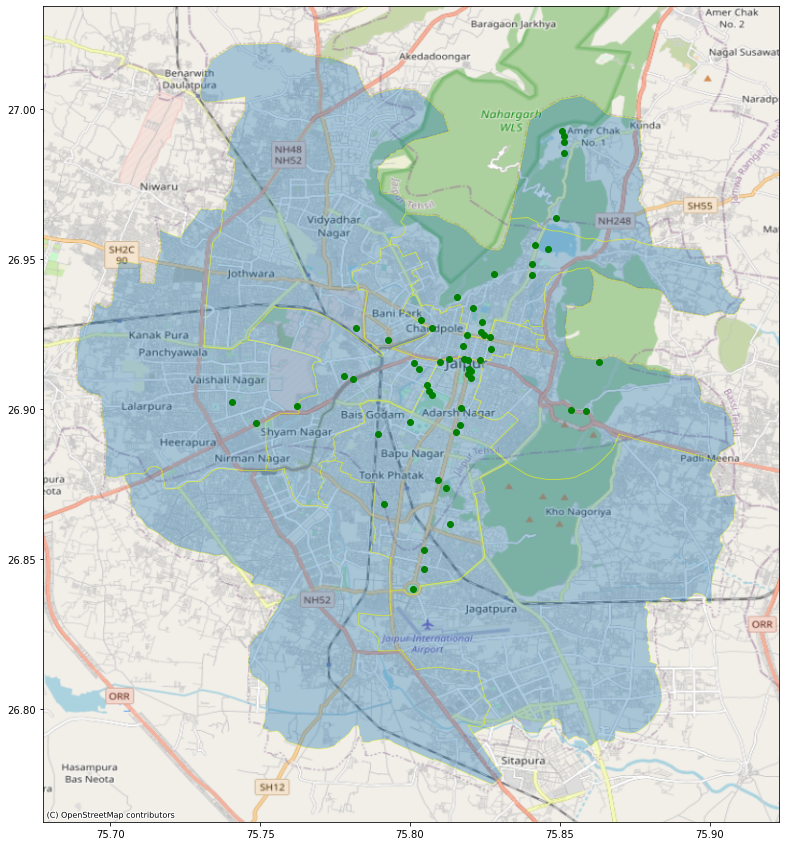

In [32]:
ax = zone['geometry'].plot(alpha=0.35, figsize =(15,15),edgecolor= "yellow", linewidth = 1)
place_merged['geometry'].plot(ax=ax, color = 'green')
cx.add_basemap(ax, crs=jaipur.crs.to_string(), source = cx.providers.OpenStreetMap.Mapnik)
plt.show()

### Geospatial Analysis using interactive map

In [33]:
sum_review = geo_hotel.groupby('Zone_Name', as_index=False)['NUMBER_OF_REVIEWS'].sum()
sum_review

,Zone_Name,NUMBER_OF_REVIEWS
0,ADARSH NAGAR,227
1,AMER ANSIK,6019
2,BAGRU ANSIK,5263
3,CIVIL LINES,60975
4,HAWA MAHAL,3627
5,JHOTWARA ANSIK,1955
6,KISHAN POLE,12473
7,MALVIYA NAGAR,27658
8,SANGANER,4130
9,VIDHYADHAR NAGAR,1663


In [34]:
zone = pd.merge(zone, sum_review, on="Zone_Name")

In [35]:
zone

,OBJECTID,Zone_Name,Total_Ward,Shape_Leng,Shape_Le_1,Shape_Area,geometry,city,NUMBER_OF_REVIEWS
0,1,ADARSH NAGAR,9,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur,227
1,2,AMER ANSIK,1,20062.756279,0.169816,0.001711,"POLYGON ((75.88071 26.95447, 75.88058 26.95450...",Jaipur,6019
2,3,BAGRU ANSIK,4,54439.858944,0.463404,0.007102,"POLYGON ((75.90057 26.87682, 75.90065 26.87643...",Jaipur,5263
3,4,CIVIL LINES,9,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,60975
4,5,HAWA MAHAL,10,39950.187426,0.344536,0.002348,"POLYGON ((75.80193 26.96498, 75.80302 26.96482...",Jaipur,3627
5,6,JHOTWARA ANSIK,4,42043.265841,0.353682,0.003999,"POLYGON ((75.73039 26.96676, 75.73187 26.96650...",Jaipur,1955
6,7,KISHAN POLE,11,19262.402135,0.166778,0.000507,"POLYGON ((75.80348 26.93497, 75.80370 26.93430...",Jaipur,12473
7,8,MALVIYA NAGAR,10,32807.683752,0.277733,0.002696,"POLYGON ((75.82069 26.91651, 75.82279 26.91608...",Jaipur,27658
8,9,SANGANER,9,59539.527922,0.507711,0.005566,"POLYGON ((75.77601 26.88251, 75.77769 26.88208...",Jaipur,4130
9,10,VIDHYADHAR NAGAR,10,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur,1663


In [36]:
with urlopen('https://raw.githubusercontent.com/datameet/Municipal_Spatial_Data/master/Jaipur/Jaipur_Zones.geojson') as response:
    zone_json = json.load(response)

In [37]:
for feature in zone_json['features']:
    feature['id'] = feature['properties']['Zone_Name']

In [38]:
#Number of Reviews vs Hotels Distribution
fig = px.choropleth_mapbox(zone, color = 'NUMBER_OF_REVIEWS',
                           color_continuous_scale="OrRd",
                           geojson=zone_json,
                           locations = 'Zone_Name',
                           #mapbox_style="open-street-map",
                           zoom=12, center = {"lat": 26.922070, "lon": 75.778885},
                           opacity=.65,
                           labels= {'NUMBER_OF_REVIEWS': 'Number of Reviews', "Zone_Name": "Zone Name"}
                          )
fig3 = px.scatter_mapbox(geo_hotel, lat='Lat', lon = "Lng", hover_name = "HOTEL")
fig.add_trace(fig3.data[0])
fig.update_layout(mapbox_style='open-street-map',margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

We can assume in this case that the number of review is 'crowded meter' of the neighborhood, and as expected the most crowded area has the most number of hotel.

In [39]:
#Number of Reviews vs Tourist Attractions Distribution 
fig = px.choropleth_mapbox(zone, color = 'NUMBER_OF_REVIEWS',
                           color_continuous_scale="OrRd",
                           geojson=zone_json,
                           locations = 'Zone_Name',
                           #mapbox_style="open-street-map",
                           zoom=12, center = {"lat": 26.922070, "lon": 75.778885},
                           opacity=.65,
                           labels= {'NUMBER_OF_REVIEWS': 'Number of Reviews', "Zone_Name": "Zone Name"}
                          )
fig2 = px.scatter_mapbox(geo_places, lat ='LATITUDE', lon="LONGITUDE", zoom = 8, color_discrete_sequence = ["forestgreen"], hover_name = "POIs")
fig.add_trace(fig2.data[0])
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Even though tourist attractions not exactly located in the most dense area it still relatively close.

In [40]:
#average price per zone
mean_price = geo_hotel.groupby('Zone_Name', as_index=False)['PRICE_RUPEES'].mean()
mean_price

,Zone_Name,PRICE_RUPEES
0,ADARSH NAGAR,1547.370000
1,AMER ANSIK,4282.355000
2,BAGRU ANSIK,4831.695000
3,CIVIL LINES,1915.952000
4,HAWA MAHAL,3140.457692
5,JHOTWARA ANSIK,2179.527273
6,KISHAN POLE,1929.961290
7,MALVIYA NAGAR,3235.621429
8,SANGANER,2172.786000
9,VIDHYADHAR NAGAR,2344.683000


In [41]:
#merge zone with average price
zone = pd.merge(zone, mean_price, on="Zone_Name")

In [42]:
zone.head()

,OBJECTID,Zone_Name,Total_Ward,Shape_Leng,Shape_Le_1,Shape_Area,geometry,city,NUMBER_OF_REVIEWS,PRICE_RUPEES
0,1,ADARSH NAGAR,9,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur,227,1547.370000
1,2,AMER ANSIK,1,20062.756279,0.169816,0.001711,"POLYGON ((75.88071 26.95447, 75.88058 26.95450...",Jaipur,6019,4282.355000
2,3,BAGRU ANSIK,4,54439.858944,0.463404,0.007102,"POLYGON ((75.90057 26.87682, 75.90065 26.87643...",Jaipur,5263,4831.695000
3,4,CIVIL LINES,9,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,60975,1915.952000
4,5,HAWA MAHAL,10,39950.187426,0.344536,0.002348,"POLYGON ((75.80193 26.96498, 75.80302 26.96482...",Jaipur,3627,3140.457692


In [43]:
#Number of Reviews vs Prices Average
fig = px.choropleth_mapbox(zone, color = 'PRICE_RUPEES',
                           color_continuous_scale="sunsetdark",
                           geojson=zone_json,
                           locations = 'Zone_Name',
                           zoom=12, center = {"lat": 26.922070, "lon": 75.778885},
                           opacity=.65,
                           labels= {'PRICE_RUPEES': 'Price (in Rupees)', "Zone_Name": "Zone Name"}
                          )
fig2 = px.scatter_mapbox(geo_hotel, lat ='Lat', lon="Lng", zoom = 8, hover_name = "HOTEL")
fig.add_trace(fig2.data[0])
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Be in a crowded place and in the middle of the city, doesn't make Civil Line neighborhood the most expensive area yet the most expensive neighborhood is Bagru Ansik which has an International Airport in the area. Does price have something to do with location? Autocorrelation Spatial would answer this. 

# DBSCAN

In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
import time

In [45]:
geo_hotel

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,Lat,Lng,geometry_hotel,Zone_Name,Shape_Leng,Shape_Le_1,Shape_Area,geometry_zone,city
0,HID1,HOTEL ANURAAG VILLA JAIPUR,898.92,1305,26.927230,75.789207,POINT (75.78921 26.92723),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
1,HID5,"ITC RAJPUTANA, JAIPUR A LUXURY COLLECTION HOTE...",3221.13,6189,26.919313,75.791175,POINT (75.79117 26.91931),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
2,HID6,HOLIDAY INN JAIPUR CITY CENTRE JAIPUR,4644.42,4392,26.902940,75.792486,POINT (75.79249 26.90294),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
3,HID9,UMAID BHAWAN HERITAGE HOUSE HOTEL JAIPUR,4045.14,3971,26.928506,75.792419,POINT (75.79242 26.92851),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
4,HID10,PEARL PALACE HERITAGE JAIPUR,1722.93,1467,26.915911,75.792374,POINT (75.79237 26.91591),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur
...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,HID228,BRANSON BACKPACKER HOMESTAY JAIPUR,1198.56,50,26.965494,75.754452,POINT (75.75445 26.96549),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur
226,HID231,HOTEL LIBRA JAIPUR,1498.20,184,26.946934,75.773664,POINT (75.77366 26.94693),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur
227,HID185,SNEH DEEP GUEST HOUSE JAIPUR,824.01,119,26.904157,75.840226,POINT (75.84023 26.90416),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur
228,HID197,ABHI ROOMS JAIPUR,749.10,8,26.908059,75.831676,POINT (75.83168 26.90806),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur


In [46]:
hotel_point = geo_hotel[['Lat','Lng']].to_numpy()

In [47]:
def get_centroid(cluster):
  """calculate the centroid of a cluster of geographic coordinate points
  Args:
    cluster coordinates, nx2 array-like (array, list of lists, etc) 
    n is the number of points(latitude, longitude)in the cluster.
  Return:
    geometry centroid of the cluster
    
  """
  cluster_ary = np.asarray(cluster)
  centroid = cluster_ary.mean(axis = 0)
  return centroid

In [48]:
# define the number of kilometers in one radiation
# which will be used to convert esp from km to radiation
kms_per_rad = 6371.0088

In [49]:
# convert eps to radians for use by haversine
epsilon = 1.5/kms_per_rad

# Extract intersection coordinates (latitude, longitude)
hotels_coords = geo_hotel[['Lat', 'Lng']].values

start_time = time.time()
dbsc = (DBSCAN(eps=epsilon, min_samples=1, algorithm='ball_tree', metric='haversine')
        .fit(np.radians(hotels_coords)))
hotel_cluster_labels = dbsc.labels_

# get the number of clusters
num_clusters = len(set(dbsc.labels_))

# print the outcome
message = 'Clustered {:,} points down to {:,} clusters, for {:.1f}% compression in {:,.2f} seconds'
print(message.format(len(geo_hotel), num_clusters, 100*(1 - float(num_clusters) / len(geo_hotel)), time.time()-start_time))
print('Silhouette coefficient: {:0.03f}'.format(metrics.silhouette_score(hotels_coords, hotel_cluster_labels)))

# turn the clusters into a pandas series,where each element is a cluster of points
dbsc_clusters = pd.Series([hotels_coords[hotel_cluster_labels==n] for n in range(num_clusters)])

Clustered 230 points down to 16 clusters, for 93.0% compression in 0.01 seconds
Silhouette coefficient: 0.166


In [50]:
# get centroid of each cluster
hotels_centroids = dbsc_clusters.map(get_centroid)
# unzip the list of centroid points (lat, lon) tuples into separate lat and lon lists
cent_lats, cent_lons = zip(*hotels_centroids)
# from these lats/lons create a new df of one representative point for eac cluster
centroids_pd = pd.DataFrame({'longitude':cent_lons, 'latitude':cent_lats})

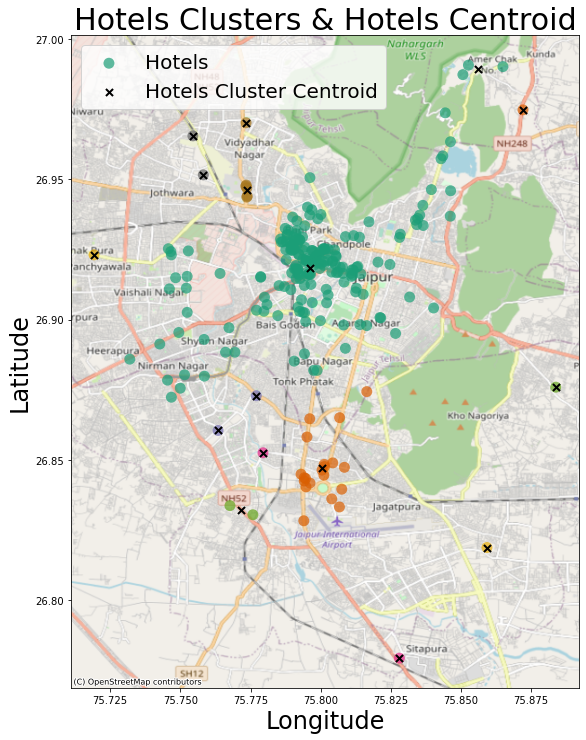

In [51]:
# Plot the faciity clusters and cluster centroid
fig, ax = plt.subplots(figsize=[20, 12])
hotels_scatter = ax.scatter(geo_hotel['Lng'], geo_hotel['Lat'], c=hotel_cluster_labels, cmap = cm.Dark2, edgecolor='None', alpha=0.7, s=120)
centroid_scatter = ax.scatter(centroids_pd['longitude'], centroids_pd['latitude'], marker='x', linewidths=2, c='k', s=50)
ax.set_title('Hotels Clusters & Hotels Centroid', fontsize = 30)
ax.set_xlabel('Longitude', fontsize=24)
ax.set_ylabel('Latitude', fontsize = 24)
ax.legend([hotels_scatter, centroid_scatter], ['Hotels', 'Hotels Cluster Centroid'], loc='upper left', fontsize = 20)
cx.add_basemap(ax, crs=jaipur.crs.to_string(), source = cx.providers.OpenStreetMap.Mapnik)
plt.show()

There are 16 Hotel Clusters that determinded by Hotel Density, The most dense place is in the city center of Jaipur and second one gathered around Jaipur International Airport

In [52]:
#Finding the centroid of the most densely cluster
fig = px.choropleth_mapbox(zone,
                           geojson=zone_json,
                           locations = 'Zone_Name',
                           #mapbox_style="open-street-map",
                           zoom=12, center = {"lat": 26.922070, "lon": 75.778885},
                           opacity=.50
                          )
fig2 = px.scatter_mapbox(centroids_pd, lat ='latitude', lon="longitude", zoom = 8, color_discrete_sequence = ["yellow"])
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.add_trace(fig2.data[0])
fig.show()

### Street network analysis:

In [53]:
centroids_pd

,longitude,latitude
0,75.796066,26.918274
1,75.856080,26.989398
2,75.872088,26.974752
3,75.800511,26.846984
4,75.777047,26.872889
5,75.763427,26.860505
6,75.828043,26.779373
7,75.779430,26.852562
8,75.771748,26.832099
9,75.883759,26.875940


In [54]:
most_dense = centroids_pd.iloc[0]

In [55]:
dense_centroid = (most_dense.latitude, most_dense.longitude)
point_centroid = Point(dense_centroid[1], dense_centroid[0])

In [56]:
most_dense

longitude    75.796066
latitude     26.918274
Name: 0, dtype: float64

In [57]:
dense_centroid

(26.91827441518518, 75.79606587010583)

Wall time: 0 ns


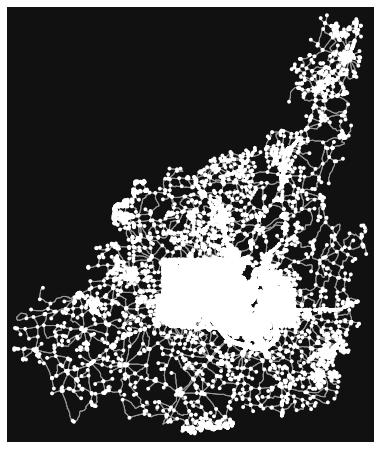

In [58]:
# Retrieve and plot all the walking streets of the city
%time
G = ox.graph_from_place("Jaipur, India", network_type='walk')
fig, ax = ox.plot_graph(G)

In [59]:
# Add speed and travel time

G = ox.add_edge_speeds(G)
G = ox.add_edge_travel_times(G)

In [60]:
# Connect the centroid point to the graph

node_nearest_place = ox.get_nearest_node(G, dense_centroid)

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\osmnx\distance.py:356: UserWarning:

The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.



In [61]:
db_places = geo_places.copy()

In [62]:
# Connect the centroid points to the graph
db_places["points_to_graph"] = db_places.geometry_place.apply(lambda x: ox.get_nearest_node(G,(x.y,x.x)))

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\osmnx\distance.py:356: UserWarning:

The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\osmnx\distance.py:356: UserWarning:

The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\osmnx\distance.py:356: UserWarning:

The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\osmnx\distance.py:356: UserWarning:

The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.

C:\Users\Ekas\.conda\envs\geo_env\lib\si

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\osmnx\distance.py:356: UserWarning:

The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\osmnx\distance.py:356: UserWarning:

The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\osmnx\distance.py:356: UserWarning:

The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.

C:\Users\Ekas\.conda\envs\geo_env\lib\site-packages\osmnx\distance.py:356: UserWarning:

The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.

C:\Users\Ekas\.conda\envs\geo_env\lib\si

In [63]:
# Find shortest paths between the centroid and each places

db_places["paths_to_places"] = db_places.points_to_graph.apply(lambda x: ox.shortest_path(G, x, node_nearest_place, weight='travel_time'))

In [64]:
# Retrieve paths' lenth in meters
db_places["paths_to_places_m"] = db_places.paths_to_places.apply(lambda x: sum(ox.utils_graph.get_route_edge_attributes(G, x, 'length')))

In [65]:
db_places_top5 = db_places.sort_values('paths_to_places_m', ascending = True)
db_places_top5 = db_places_top5.head(5)
db_places_top5

,PID,POIs,LATITUDE,LONGITUDE,IN-TIME1,IN-TIME2,OUT-TIME1,OUT-TIME2,PRIORITY_1,PRIORITY_2,...,geometry_place,Zone_Name,Shape_Leng,Shape_Le_1,Shape_Area,geometry_zone,city,points_to_graph,paths_to_places,paths_to_places_m
55,POI65,CRYSTAL MALL JAIPUR,26.923128,75.792787,10:00,-,23:00,-,Shopping,-,...,POINT (75.79279 26.92313),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,8642549581,"[8642549581, 6876783753, 6876783750, 378042636...",896.621
51,POI34,AMRAPALI MUSEUM,26.915197,75.801407,11:00,-,18:00,-,Museum,-,...,POINT (75.80141 26.91520),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,6876774167,"[6876774167, 317133720, 317133717, 4733958923,...",1106.206
54,POI50,DEER PARK JAIPUR,26.913232,75.803045,6:00,-,17:00,-,Scenic,Adventure,...,POINT (75.80304 26.91323),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,318565305,"[318565305, 317133955, 318565443, 4750213100, ...",1456.526
34,POI26,RAJ MANDIR,26.915499,75.810164,11:00,-,2:00,-,Shows and Concerts,-,...,POINT (75.81016 26.91550),MALVIYA NAGAR,32807.683752,0.277733,0.002696,"POLYGON ((75.82069 26.91651, 75.82279 26.91608...",Jaipur,8633971086,"[8633971086, 318559845, 316926687, 1467124449,...",1908.306
56,POI63,PEACOCK GARDEN JAIPUR,26.927006,75.782151,5:00,-,19:00,-,Scenic,-,...,POINT (75.78215 26.92701),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur,8638056431,"[8638056431, 3780586581, 2393622915, 708765003...",2014.281


In [66]:
centroids_rename = centroids_pd.rename(columns={"latitude":"LATITUDE", "longitude":"LONGITUDE"})

In [67]:
centroids_rename.head()

,LONGITUDE,LATITUDE
0,75.796066,26.918274
1,75.856080,26.989398
2,75.872088,26.974752
3,75.800511,26.846984
4,75.777047,26.872889


In [68]:
db_places_top5_centroid = db_places_top5.copy()
db_places_top5_centroid = db_places_top5.append([centroids_rename.head(1)]*6,ignore_index=True)
db_places_top5_centroid = db_places_top5_centroid.reindex([5,0,6,1,7,2,8,3,9,4,10])
db_places_top5_centroid

,PID,POIs,LATITUDE,LONGITUDE,IN-TIME1,IN-TIME2,OUT-TIME1,OUT-TIME2,PRIORITY_1,PRIORITY_2,...,geometry_place,Zone_Name,Shape_Leng,Shape_Le_1,Shape_Area,geometry_zone,city,points_to_graph,paths_to_places,paths_to_places_m
5,NaN,NaN,26.918274,75.796066,NaN,NaN,NaN,NaN,NaN,NaN,...,None,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN
0,POI65,CRYSTAL MALL JAIPUR,26.923128,75.792787,10:00,-,23:00,-,Shopping,-,...,POINT (75.79279 26.92313),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,8.642550e+09,"[8642549581, 6876783753, 6876783750, 378042636...",896.621
6,NaN,NaN,26.918274,75.796066,NaN,NaN,NaN,NaN,NaN,NaN,...,None,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN
1,POI34,AMRAPALI MUSEUM,26.915197,75.801407,11:00,-,18:00,-,Museum,-,...,POINT (75.80141 26.91520),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,6.876774e+09,"[6876774167, 317133720, 317133717, 4733958923,...",1106.206
7,NaN,NaN,26.918274,75.796066,NaN,NaN,NaN,NaN,NaN,NaN,...,None,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN
2,POI50,DEER PARK JAIPUR,26.913232,75.803045,6:00,-,17:00,-,Scenic,Adventure,...,POINT (75.80304 26.91323),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,3.185653e+08,"[318565305, 317133955, 318565443, 4750213100, ...",1456.526
8,NaN,NaN,26.918274,75.796066,NaN,NaN,NaN,NaN,NaN,NaN,...,None,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN
3,POI26,RAJ MANDIR,26.915499,75.810164,11:00,-,2:00,-,Shows and Concerts,-,...,POINT (75.81016 26.91550),MALVIYA NAGAR,32807.683752,0.277733,0.002696,"POLYGON ((75.82069 26.91651, 75.82279 26.91608...",Jaipur,8.633971e+09,"[8633971086, 318559845, 316926687, 1467124449,...",1908.306
9,NaN,NaN,26.918274,75.796066,NaN,NaN,NaN,NaN,NaN,NaN,...,None,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN
4,POI63,PEACOCK GARDEN JAIPUR,26.927006,75.782151,5:00,-,19:00,-,Scenic,-,...,POINT (75.78215 26.92701),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur,8.638056e+09,"[8638056431, 3780586581, 2393622915, 708765003...",2014.281


In [69]:
#Finding the centroid of the most densely cluster
fig = px.choropleth_mapbox(zone,
                           geojson=zone_json,
                           locations = 'Zone_Name',
                           zoom=12, center = {"lat": 26.922070, "lon": 75.778885},
                           opacity=.30
                          )
fig2 = px.scatter_mapbox(db_places_top5, lat ='LATITUDE', lon="LONGITUDE", color_discrete_sequence = ["yellow"])
fig3 = px.scatter_mapbox(centroids_pd.head(1), lat = 'latitude', lon='longitude', color_discrete_sequence = ["blue"])
fig4 = px.line_mapbox(db_places_top5_centroid, lat="LATITUDE", lon="LONGITUDE", color_discrete_sequence = ["red"], hover_name = 'POIs')
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.add_trace(fig2.data[0])
fig.add_trace(fig3.data[0])
fig.add_trace(fig4.data[0])
fig.show()

Nearest tourist attractions to the density center are :
1. Crystal Mall Jaipur (896 M)
2. AMRAPALI MUSEUM (1106 M)
3. DEER PARK JAIPUR (1456 M)

In [70]:
distance_place = geo_places.copy()
distance_hotel = geo_hotel.copy()

In [71]:
distance_place.columns

Index(['PID', 'POIs', 'LATITUDE', 'LONGITUDE', 'IN-TIME1', 'IN-TIME2',
       'OUT-TIME1', 'OUT-TIME2', 'PRIORITY_1', 'PRIORITY_2', 'PRIORITY_3',
       'PRIORITY_4', 'PRIORITY_5', 'geometry_place', 'Zone_Name', 'Shape_Leng',
       'Shape_Le_1', 'Shape_Area', 'geometry_zone', 'city'],
      dtype='object')

In [72]:
distance_hotel.columns

Index(['HID', 'HOTEL', 'PRICE_RUPEES', 'NUMBER_OF_REVIEWS', 'Lat', 'Lng',
       'geometry_hotel', 'Zone_Name', 'Shape_Leng', 'Shape_Le_1', 'Shape_Area',
       'geometry_zone', 'city'],
      dtype='object')

In [73]:
# Renaming the column names 
distance_place=distance_place.rename(columns = {'LATITUDE':'lat','LONGITUDE':'lon'})
distance_hotel=distance_hotel.rename(columns = {'Lat':'lat','Lng':'lon'})


### Hotel cluster by Tourist Attractions

In [74]:
from math import radians, cos, sin, asin, sqrt
def dist(lat1, long1, lat2, long2):
    # convert decimal degrees to radians 
    lat1, long1, lat2, long2 = map(radians, [lat1, long1, lat2, long2])
    # haversine formula 
    dlon = long2 - long1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    # Radius of earth in kilometers is 6371
    m = 6371000* c
    return m

In [75]:
def find_nearest(lat, long):
    distances = distance_place.apply(
        lambda row: dist(lat, long, row['lat'], row['lon']), 
        axis=1)
    return distance_place.loc[distances.idxmin(), 'POIs']

In [76]:
distance_hotel['POIs'] = distance_hotel.apply(
    lambda row: find_nearest(row['lat'], row['lon']), 
    axis=1)
# To check the data frame if it has a new column of hotel name (for each and every member's location in the list)
distance_hotel.tail()

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,lat,lon,geometry_hotel,Zone_Name,Shape_Leng,Shape_Le_1,Shape_Area,geometry_zone,city,POIs
225,HID228,BRANSON BACKPACKER HOMESTAY JAIPUR,1198.56,50,26.965494,75.754452,POINT (75.75445 26.96549),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur,PEACOCK GARDEN JAIPUR
226,HID231,HOTEL LIBRA JAIPUR,1498.20,184,26.946934,75.773664,POINT (75.77366 26.94693),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur,PEACOCK GARDEN JAIPUR
227,HID185,SNEH DEEP GUEST HOUSE JAIPUR,824.01,119,26.904157,75.840226,POINT (75.84023 26.90416),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur,VIDYADHAR GARDEN
228,HID197,ABHI ROOMS JAIPUR,749.10,8,26.908059,75.831676,POINT (75.83168 26.90806),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur,MASALA CHOWK
229,HID216,HOTEL SURYA GARH JAIPUR,3069.00,100,26.936874,75.846184,POINT (75.84618 26.93687),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur,MAHARANI KI CHHATRI JAIPUR


In [77]:
distance_merged = pd.merge(distance_hotel, distance_place[['POIs','lat','lon']],on='POIs', how='left')
distance_merged = distance_merged.rename(columns = {'lat_x':'place_lat','lon_x':'place_lon','lat_y':'hotel_lat','lon_y':'hotel_lon'})

In [78]:
distance_merged.tail()

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,place_lat,place_lon,geometry_hotel,Zone_Name,Shape_Leng,Shape_Le_1,Shape_Area,geometry_zone,city,POIs,hotel_lat,hotel_lon
225,HID228,BRANSON BACKPACKER HOMESTAY JAIPUR,1198.56,50,26.965494,75.754452,POINT (75.75445 26.96549),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur,PEACOCK GARDEN JAIPUR,26.927006,75.782151
226,HID231,HOTEL LIBRA JAIPUR,1498.20,184,26.946934,75.773664,POINT (75.77366 26.94693),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur,PEACOCK GARDEN JAIPUR,26.927006,75.782151
227,HID185,SNEH DEEP GUEST HOUSE JAIPUR,824.01,119,26.904157,75.840226,POINT (75.84023 26.90416),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur,VIDYADHAR GARDEN,26.899791,75.853619
228,HID197,ABHI ROOMS JAIPUR,749.10,8,26.908059,75.831676,POINT (75.83168 26.90806),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur,MASALA CHOWK,26.910342,75.820175
229,HID216,HOTEL SURYA GARH JAIPUR,3069.00,100,26.936874,75.846184,POINT (75.84618 26.93687),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur,MAHARANI KI CHHATRI JAIPUR,26.944763,75.840763


In [79]:
# Creating a new column to generate the output by passing lat long information to Haversine Equation
distance_merged['distance'] = [dist(distance_merged.place_lat[i],distance_merged.place_lon[i],distance_merged.hotel_lat[i],distance_merged.hotel_lon[i]) for i in range(len(distance_merged))]
distance_merged['distance'] = distance_merged['distance'].round()
# Printing the data table 
distance_merged

,HID,HOTEL,PRICE_RUPEES,NUMBER_OF_REVIEWS,place_lat,place_lon,geometry_hotel,Zone_Name,Shape_Leng,Shape_Le_1,Shape_Area,geometry_zone,city,POIs,hotel_lat,hotel_lon,distance
0,HID1,HOTEL ANURAAG VILLA JAIPUR,898.92,1305,26.927230,75.789207,POINT (75.78921 26.92723),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,CRYSTAL MALL JAIPUR,26.923128,75.792787,578.0
1,HID5,"ITC RAJPUTANA, JAIPUR A LUXURY COLLECTION HOTE...",3221.13,6189,26.919313,75.791175,POINT (75.79117 26.91931),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,CRYSTAL MALL JAIPUR,26.923128,75.792787,453.0
2,HID6,HOLIDAY INN JAIPUR CITY CENTRE JAIPUR,4644.42,4392,26.902940,75.792486,POINT (75.79249 26.90294),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,AMAR JAWAN JYOTI JAIPUR,26.895697,75.799919,1092.0
3,HID9,UMAID BHAWAN HERITAGE HOUSE HOTEL JAIPUR,4045.14,3971,26.928506,75.792419,POINT (75.79242 26.92851),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,CRYSTAL MALL JAIPUR,26.923128,75.792787,599.0
4,HID10,PEARL PALACE HERITAGE JAIPUR,1722.93,1467,26.915911,75.792374,POINT (75.79237 26.91591),CIVIL LINES,45734.655487,0.389894,0.002249,"POLYGON ((75.79579 26.95459, 75.79771 26.95081...",Jaipur,CRYSTAL MALL JAIPUR,26.923128,75.792787,804.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,HID228,BRANSON BACKPACKER HOMESTAY JAIPUR,1198.56,50,26.965494,75.754452,POINT (75.75445 26.96549),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur,PEACOCK GARDEN JAIPUR,26.927006,75.782151,5085.0
226,HID231,HOTEL LIBRA JAIPUR,1498.20,184,26.946934,75.773664,POINT (75.77366 26.94693),VIDHYADHAR NAGAR,47977.653244,0.406147,0.005174,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur,PEACOCK GARDEN JAIPUR,26.927006,75.782151,2370.0
227,HID185,SNEH DEEP GUEST HOUSE JAIPUR,824.01,119,26.904157,75.840226,POINT (75.84023 26.90416),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur,VIDYADHAR GARDEN,26.899791,75.853619,1414.0
228,HID197,ABHI ROOMS JAIPUR,749.10,8,26.908059,75.831676,POINT (75.83168 26.90806),ADARSH NAGAR,39640.168918,0.339434,0.002827,"POLYGON ((75.85990 26.94694, 75.85993 26.94689...",Jaipur,MASALA CHOWK,26.910342,75.820175,1168.0


In [80]:
import plotly.express as px
px.set_mapbox_access_token(open("map_token.txt").read())
df = distance_merged
fig = px.scatter_mapbox(df, lat="place_lat", lon="place_lon", color="POIs", hover_name = "POIs",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
fig.update_layout(mapbox_style='open-street-map')
fig.show()

By looking at this map we directly can find out which hotel to book if we want to visit spesific tourist attraction, this can be used for recommendation system of hotels.

### Autocorrelation Spatial of Hotel Prices

In [83]:
import numpy
import libpysal
import pysal
import seaborn
from pysal.explore import esda  
from pysal import lib

In [84]:
hotel_listing = gpd.GeoDataFrame(geo_hotel)
hotel_listing = hotel_listing.rename(columns = {'geometry_hotel' : 'geometry'})
w_knn = libpysal.weights.KNN.from_dataframe(hotel_listing, k=10)
w_kernel = libpysal.weights.Kernel.from_dataframe(hotel_listing, fixed=True)

<AxesSubplot:>

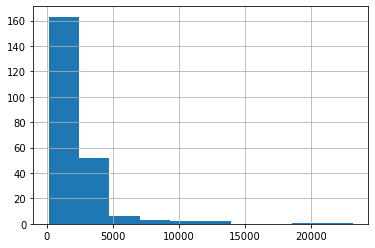

In [85]:
hotel_listing.PRICE_RUPEES.hist()

In [86]:
hotel_listing['log_price'] = numpy.log(hotel_listing.PRICE_RUPEES)

In [87]:
w_knn[1]

{83: 1.0,
 219: 1.0,
 20: 1.0,
 57: 1.0,
 61: 1.0,
 95: 1.0,
 52: 1.0,
 50: 1.0,
 4: 1.0,
 160: 1.0}

In [88]:
local_sum = 0
#for the sites surrounding site 1
for ix in w_knn[1].keys():
    #take each other nearby site's log price
    neighbor_log_price = hotel_listing.loc[ix].log_price
    #and add them up
    local_sum = local_sum + neighbor_log_price
print('The local sum is: Rs.{:.2f}'.format(local_sum))

The local sum is: Rs.71.34


In [89]:
pysal.lib.weights.lag_spatial(w_knn, hotel_listing.log_price)

array([69.09923359, 71.34377048, 76.46553292, 70.13165501, 69.09948731,
       69.0161057 , 75.76659667, 70.18392344, 72.59529044, 73.22996139,
       65.75853352, 72.64770553, 71.99056137, 72.71475616, 70.70566064,
       72.24481506, 75.24897853, 71.44248253, 72.31299421, 73.34085271,
       71.15989973, 74.66475869, 70.90176323, 71.08448046, 70.56907142,
       77.89469005, 71.45673286, 70.45953386, 73.670065  , 65.88369667,
       74.60984626, 71.3545726 , 72.50934801, 78.4092446 , 71.81157871,
       69.08169587, 64.00270606, 72.12926653, 73.45541805, 64.69585324,
       75.46870333, 72.51378085, 72.39602648, 76.7214663 , 73.15300035,
       71.64603343, 70.27741099, 71.76593743, 73.97332663, 72.71785114,
       74.341871  , 70.87752185, 72.66397713, 74.44386893, 73.7015663 ,
       72.5131558 , 69.73135236, 69.99514764, 72.18964797, 73.54812745,
       70.26368977, 71.34222129, 76.34210184, 71.78022246, 78.44698492,
       68.84271584, 66.48761271, 73.503323  , 66.4149676 , 73.84

In [90]:
#extract the full sparse W matrix:
wmatrix = w_knn.full()[0]

In [91]:
#and use matrix multiplication to obtain Wx
wmatrix@hotel_listing[['log_price']].values

array([[69.09923359],
       [71.34377048],
       [76.46553292],
       [70.13165501],
       [69.09948731],
       [69.0161057 ],
       [75.76659667],
       [70.18392344],
       [72.59529044],
       [73.22996139],
       [65.75853352],
       [72.64770553],
       [71.99056137],
       [72.71475616],
       [70.70566064],
       [72.24481506],
       [75.24897853],
       [71.44248253],
       [72.31299421],
       [73.34085271],
       [71.15989973],
       [74.66475869],
       [70.90176323],
       [71.08448046],
       [70.56907142],
       [77.89469005],
       [71.45673286],
       [70.45953386],
       [73.670065  ],
       [65.88369667],
       [74.60984626],
       [71.3545726 ],
       [72.50934801],
       [78.4092446 ],
       [71.81157871],
       [69.08169587],
       [64.00270606],
       [72.12926653],
       [73.45541805],
       [64.69585324],
       [75.46870333],
       [72.51378085],
       [72.39602648],
       [76.7214663 ],
       [73.15300035],
       [71

In [92]:
w_knn.transform = 'r'

In [93]:
w_knn[1]

{83: 0.1,
 219: 0.1,
 20: 0.1,
 57: 0.1,
 61: 0.1,
 95: 0.1,
 52: 0.1,
 50: 0.1,
 4: 0.1,
 160: 0.1}

In [94]:
local_sum = 0
#for the sites surrounding site 1
for ix in w_knn[1].keys():
    #take each other nearby site's log price
    neighbor_log_price = hotel_listing.loc[ix].log_price
    #and add them up
    local_sum = local_sum + neighbor_log_price
#then, make sure to divide by the number of neighbors
# to get the local average:
n_neighbors = len(w_knn[1].keys())

print('The local average is: Rs.{:.2f}'.format(local_sum/n_neighbors))

The local average is: Rs.7.13


In [95]:
pysal.lib.weights.lag_spatial(w_knn, hotel_listing.log_price)

array([6.90992336, 7.13437705, 7.64655329, 7.0131655 , 6.90994873,
       6.90161057, 7.57665967, 7.01839234, 7.25952904, 7.32299614,
       6.57585335, 7.26477055, 7.19905614, 7.27147562, 7.07056606,
       7.22448151, 7.52489785, 7.14424825, 7.23129942, 7.33408527,
       7.11598997, 7.46647587, 7.09017632, 7.10844805, 7.05690714,
       7.78946901, 7.14567329, 7.04595339, 7.3670065 , 6.58836967,
       7.46098463, 7.13545726, 7.2509348 , 7.84092446, 7.18115787,
       6.90816959, 6.40027061, 7.21292665, 7.34554181, 6.46958532,
       7.54687033, 7.25137808, 7.23960265, 7.67214663, 7.31530003,
       7.16460334, 7.0277411 , 7.17659374, 7.39733266, 7.27178511,
       7.4341871 , 7.08775218, 7.26639771, 7.44438689, 7.37015663,
       7.25131558, 6.97313524, 6.99951476, 7.2189648 , 7.35481275,
       7.02636898, 7.13422213, 7.63421018, 7.17802225, 7.84469849,
       6.88427158, 6.64876127, 7.3503323 , 6.64149676, 7.3849453 ,
       7.36916252, 6.94840917, 7.24726444, 7.28153539, 6.45706

In [96]:
w_kernel.transform = 'r'

In [97]:
w_kernel[1]

{190: 0.0015307311404084462,
 195: 1.311911071612205e-05,
 15: 0.0011809378946960908,
 212: 0.0005473510482087454,
 211: 0.0015874586037029868,
 214: 0.0006006883792768747,
 21: 0.002381327810956279,
 72: 0.0026720355675470034,
 82: 0.0036195338663019606,
 55: 0.002934448613602954,
 131: 0.005398576945010974,
 152: 0.003420114405204554,
 40: 0.005670364324609539,
 129: 0.0037447409734645597,
 43: 0.005646468032410529,
 157: 0.00523439350302817,
 213: 0.0018800997509759167,
 215: 0.0022412389843592872,
 206: 0.002663665226969656,
 208: 0.0027842341362193314,
 209: 0.002359930143811821,
 216: 0.004325706095072026,
 76: 0.005103055196086961,
 48: 0.006152976482771557,
 67: 0.006163653136016033,
 80: 0.005282916410486381,
 6: 0.005804805166671713,
 91: 0.005617714905348112,
 14: 0.006663211226674522,
 86: 0.006769310522746184,
 2: 0.005737259344397397,
 84: 0.005939775852938877,
 77: 0.006266927540784712,
 30: 0.006732549042936254,
 38: 0.006877262469280926,
 5: 0.0072751640063741475,
 34:

In [98]:
pysal.lib.weights.lag_spatial(w_kernel, hotel_listing.log_price)

array([7.31097647, 7.32557032, 7.37118732, 7.31411454, 7.33449106,
       7.33703165, 7.34750458, 7.31201818, 7.31068005, 7.32629273,
       7.31200881, 7.33237469, 7.33792736, 7.3347477 , 7.34139465,
       7.48193941, 7.36527884, 7.32340699, 7.31120842, 7.33322925,
       7.32872859, 7.38790373, 7.31299655, 7.33174812, 7.31532128,
       7.36555046, 7.33821326, 7.31851854, 7.35948472, 7.31138923,
       7.34707355, 7.33714844, 7.3105188 , 7.3807352 , 7.33816593,
       7.31337199, 7.31273799, 7.31438174, 7.34649464, 7.31315803,
       7.37347239, 7.30340149, 7.33716832, 7.37417092, 7.32623307,
       7.30992283, 7.31064596, 7.33501863, 7.3302591 , 7.32972075,
       7.32392919, 7.3145863 , 7.33013053, 7.30884402, 7.32509043,
       7.40646165, 7.32868086, 7.32889987, 7.33039736, 7.33771028,
       7.32125886, 7.32914683, 7.34023311, 7.32528129, 7.38108197,
       7.31794838, 7.31236816, 7.32976067, 7.31909574, 7.30997315,
       7.31116831, 7.32883935, 7.40607516, 7.32405855, 7.31287

Text(0, 0.5, 'KNN Local Average')

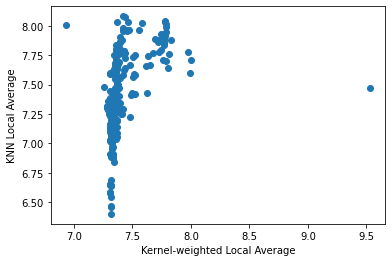

In [99]:
plt.scatter(pysal.lib.weights.lag_spatial(w_kernel, hotel_listing.log_price),
           libpysal.weights.lag_spatial(w_knn, hotel_listing.log_price))
plt.xlabel("Kernel-weighted Local Average")
plt.ylabel("KNN Local Average")

In [100]:
moran = pysal.explore.esda.moran.Moran(hotel_listing.log_price,w_kernel)
moran.I

0.09990371991295081

This value means slightly positive spatial autocorrelation in Jaipur Hotels prices, in other words, there are slight price similarities among nearby locations